# Data loading

In [1]:
!pip install pandas 
!pip install top2vec
!pip install nltk
!pip install gensim
!pip install pyLDAvis
!pip install matplotlib

import pandas as pd
from top2vec import Top2Vec
import re
import string
import nltk
nltk.download('stopwords')
nltk.download('wordnet')
from nltk.corpus import stopwords
from nltk.stem import SnowballStemmer, WordNetLemmatizer
import gensim
from gensim import corpora, models
from gensim.models.coherencemodel import CoherenceModel
from collections import Counter
import matplotlib.pyplot as plt
import matplotlib.cm as cm
from wordcloud import WordCloud
from dateutil import parser
import pyLDAvis
import pyLDAvis.gensim_models

  Using cached top2vec-1.0.29-py3-none-any.whl (26 kB)
  Using cached hdbscan-0.8.29.tar.gz (5.2 MB)
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done
  Using cached umap-learn-0.5.3.tar.gz (88 kB)
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.0/24.0 MB 8.7 MB/s eta 0:00:0000:0100:01
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 222.8/222.8 kB 8.4 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Using cached smart_open-6.3.0-py3-none-any.whl (56 kB)
  Using cached Cython-0.29.35-py2.py3-none-any.whl (988 kB)
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.5/2.5 MB 8.1 MB/s eta 0:00:00ta 0:00:01
  Using cached pynndescent-0.5.10.tar.gz (1.1 MB)
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 28.1/28.1 MB 8.9 MB/s eta 0:00:0000:0100:01m
  Created wheel for hdbscan: filename=hdbscan-0.8.29-cp310-cp310-macosx_11_0_

/Users/leonardbrenk/miniconda3/lib/python3.10/site-packages/umap/distances.py:1063: NumbaDeprecationWarning: The 'nopython' keyword argument was not supplied to the 'numba.jit' decorator. The implicit default value for this argument is currently False, but it will be changed to True in Numba 0.59.0. See https://numba.readthedocs.io/en/stable/reference/deprecation.html#deprecation-of-object-mode-fall-back-behaviour-when-using-jit for details.
  @numba.jit()
/Users/leonardbrenk/miniconda3/lib/python3.10/site-packages/umap/distances.py:1071: NumbaDeprecationWarning: The 'nopython' keyword argument was not supplied to the 'numba.jit' decorator. The implicit default value for this argument is currently False, but it will be changed to True in Numba 0.59.0. See https://numba.readthedocs.io/en/stable/reference/deprecation.html#deprecation-of-object-mode-fall-back-behaviour-when-using-jit for details.
  @numba.jit()
/Users/leonardbrenk/miniconda3/lib/python3.10/site-packages/umap/distances.py:

In [ ]:
#Code to split sentiment16k to be able to upload it to Github

# Determine the midpoint to split the data
# splitpoint1 = len(data) // 3
# splitpoint2 = 2 * len(data) // 3

# # Split the data into three parts
# part1 = data[:splitpoint1]
# part2 = data[splitpoint1:splitpoint2]
# part3 = data[splitpoint2:]

# # Write the three parts to three separate files
# part1.to_csv('sentiment_16k_part1.csv', index=False)
# part2.to_csv('sentiment_16k_part2.csv', index=False)
# part3.to_csv('sentiment_16k_part3.csv', index=False)

In [2]:
# Import files
df_gpt = pd.read_csv('/Users/leonardbrenk/Downloads/gpt_raw.csv')

df_16k1 = pd.read_csv('/Users/leonardbrenk/Downloads/sentiment_16k_part1.csv', header=0, encoding='ISO-8859-1')
df_16k2 = pd.read_csv('/Users/leonardbrenk/Downloads/sentiment_16k_part2.csv', header=0, encoding='ISO-8859-1')
df_16k3 = pd.read_csv('/Users/leonardbrenk/Downloads/sentiment_16k_part3.csv', header=0, encoding='ISO-8859-1')

df_all_topics1 = pd.read_csv('/Users/leonardbrenk/Downloads/df_gpt_including_topics_1.csv')
df_all_topics2 = pd.read_csv('/Users/leonardbrenk/Downloads/df_gpt_including_topics_2.csv')

# Rename content column in df_gpt
df_gpt = df_gpt.rename(columns={'content': 'tweets'})

# Concatenate the three parts of df16k and the two of df_all_topics
df_16k = pd.concat([df_16k1, df_16k2, df_16k3], ignore_index=True)
df_all_topics = pd.concat([df_all_topics1, df_all_topics2], ignore_index=True)

In [3]:
print(df_16k.info())
df_16k.head(20)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1600000 entries, 0 to 1599999
Data columns (total 6 columns):
 #   Column  Non-Null Count    Dtype 
---  ------  --------------    ----- 
 0   target  1600000 non-null  int64 
 1   id      1600000 non-null  int64 
 2   date    1600000 non-null  object
 3   flag    1600000 non-null  object
 4   user    1600000 non-null  object
 5   text    1600000 non-null  object
dtypes: int64(2), object(4)
memory usage: 73.2+ MB
None


,target,id,date,flag,user,text
0,0,1467810369,Mon Apr 06 22:19:45 PDT 2009,NO_QUERY,_TheSpecialOne_,"@switchfoot http://twitpic.com/2y1zl - Awww, t..."
1,0,1467810672,Mon Apr 06 22:19:49 PDT 2009,NO_QUERY,scotthamilton,is upset that he can't update his Facebook by ...
2,0,1467810917,Mon Apr 06 22:19:53 PDT 2009,NO_QUERY,mattycus,@Kenichan I dived many times for the ball. Man...
3,0,1467811184,Mon Apr 06 22:19:57 PDT 2009,NO_QUERY,ElleCTF,my whole body feels itchy and like its on fire
4,0,1467811193,Mon Apr 06 22:19:57 PDT 2009,NO_QUERY,Karoli,"@nationwideclass no, it's not behaving at all...."
5,0,1467811372,Mon Apr 06 22:20:00 PDT 2009,NO_QUERY,joy_wolf,@Kwesidei not the whole crew
6,0,1467811592,Mon Apr 06 22:20:03 PDT 2009,NO_QUERY,mybirch,Need a hug
7,0,1467811594,Mon Apr 06 22:20:03 PDT 2009,NO_QUERY,coZZ,@LOLTrish hey long time no see! Yes.. Rains a...
8,0,1467811795,Mon Apr 06 22:20:05 PDT 2009,NO_QUERY,2Hood4Hollywood,@Tatiana_K nope they didn't have it
9,0,1467812025,Mon Apr 06 22:20:09 PDT 2009,NO_QUERY,mimismo,@twittera que me muera ?


In [4]:
print(df_gpt.info())
df_gpt.head(20)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 500036 entries, 0 to 500035
Data columns (total 6 columns):
 #   Column         Non-Null Count   Dtype  
---  ------         --------------   -----  
 0   date           500036 non-null  object 
 1   id             500030 non-null  object 
 2   tweets         500030 non-null  object 
 3   username       500002 non-null  object 
 4   like_count     499974 non-null  float64
 5   retweet_count  499974 non-null  float64
dtypes: float64(2), object(4)
memory usage: 22.9+ MB
None


,date,id,tweets,username,like_count,retweet_count
0,2023-03-29 22:58:21+00:00,1641213230730051584,"Free AI marketing and automation tools, strate...",RealProfitPros,0.0,0.0
1,2023-03-29 22:58:18+00:00,1641213218520481805,@MecoleHardman4 Chat GPT says it’s 15. 😂,AmyLouWho321,0.0,0.0
2,2023-03-29 22:57:53+00:00,1641213115684536323,https://t.co/FjJSprt0te - Chat with any PDF!\n...,yjleon1976,0.0,0.0
3,2023-03-29 22:57:52+00:00,1641213110915571715,"AI muses: ""In the court of life, we must all f...",ChatGPT_Thinks,0.0,0.0
4,2023-03-29 22:57:26+00:00,1641213003260633088,Most people haven't heard of Chat GPT yet.\nFi...,nikocosmonaut,0.0,0.0
5,2023-03-29 22:57:20+00:00,1641212975012016128,@nytimes No! Chat Gpt has been putting togethe...,cordydbarb,0.0,0.0
6,2023-03-29 22:57:06+00:00,1641212917868646400,@ylzkrtt Yes also by chat gpt you can make gen...,gomezfidelphani,1.0,0.0
7,2023-03-29 22:57:02+00:00,1641212902375063552,@robinhanson @razibkhan Most people haven't he...,nikocosmonaut,0.0,0.0
8,2023-03-29 22:56:52+00:00,1641212856984109072,Yours Robotically - by Shaun Usher - Letters o...,lawyermarketer,0.0,0.0
9,2023-03-29 22:56:49+00:00,1641212845441585152,This is a metaphor for the limited perception ...,ashleighgrente2,2.0,0.0


In [5]:
print(df_all_topics.info())
df_all_topics.head(20)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 271921 entries, 0 to 271920
Data columns (total 8 columns):
 #   Column                                 Non-Null Count   Dtype 
---  ------                                 --------------   ----- 
 0   topic                                  271921 non-null  int64 
 1   index                                  271921 non-null  int64 
 2   tweets                                 271921 non-null  object
 3   tweets_preprocessed                    271921 non-null  object
 4   tweets_preprocessed_without_stopwords  271426 non-null  object
 5   tweets_preprocessed_stemmed            271426 non-null  object
 6   tweets_preprocessed_lemmatized         271426 non-null  object
 7   topic_name                             271921 non-null  object
dtypes: int64(2), object(6)
memory usage: 16.6+ MB
None


,topic,index,tweets,tweets_preprocessed,tweets_preprocessed_without_stopwords,tweets_preprocessed_stemmed,tweets_preprocessed_lemmatized,topic_name
0,0,388039,20 things to do with ChatGPT\n\n#ChatGPT #Chat...,20 things to do with chatgpt,20 things chatgpt,20 thing chatgpt,20 thing chatgpt,not defined
1,0,50266,That's much better. \n#ChatGPT https://t.co/mr...,that s much better,much better,much better,much better,not defined
2,0,196611,How do i do that?\n\n#web #webdev #webdesign #...,how do i do that,NaN,NaN,NaN,not defined
3,0,207945,Did I write this or #ChatGPT ?,did i write this or,write,write,write,not defined
4,0,391297,Time to #BoycottBuzzfeed\n#AI #ChatGPT #Buzzfeed,time to,time,time,time,not defined
5,0,385138,some other fiddlings with #chatgpt https://t.c...,some other fiddlings with,fiddlings,fiddl,fiddlings,not defined
6,0,295867,#ChatGPT time https://t.co/ItQJ6vmUD4,time,time,time,time,not defined
7,0,31793,Sunflower \nby ChatGPT\n\n#AIart #ChatGPT #SVG...,sunflower by chatgpt,sunflower chatgpt,sunflow chatgpt,sunflower chatgpt,not defined
8,0,305579,@catturd2 Something about #ChatGPT ?,something about,something,someth,something,not defined
9,0,330325,@Mr_Magic_Bryce @ChatGPT What’s all this ??🤷🏾‍...,what s all this,NaN,NaN,NaN,not defined


# Preprocessing

##### df_gpt

In [6]:
# Drop the contentless rows
print(df_gpt["tweets"].isna().sum()) # 6 rows have no content
df_gpt.dropna(subset=["tweets"], inplace=True)

6


In [7]:
print(df_gpt["tweets"].isna().sum()) # 0 rows have no content after removing the rows with no content

0


In [8]:
# Preprocessing function
def clean_tweet(df, column):
    """
    Preprocessing function to clean tweets.
    """

    new_column = column + '_preprocessed'

    # Convert to lowercase
    df[new_column] = df[column].str.lower()

    # Remove new line characters
    df[new_column] = df[new_column].str.replace(r"\\t|\\n|\\r", " ", regex=True)
    df[new_column] = df[new_column].str.replace("\t|\n|\r", " ", regex=True)

    # Only include Latin characters
    df[new_column] = df[new_column].apply(lambda x: re.sub(r'[^\x00-\x7F]+', ' ', x))

    # Remove URLs
    df[new_column] = df[new_column].apply(lambda x: re.sub(r"http\S+", " ", x))

    # Remove mentions
    df[new_column] = df[new_column].apply(lambda x: re.sub(r"@\S+", " ", x))

    # Remove hashtag icon from text, but keep the text content
    #df[new_column] = df[new_column].apply(lambda x: re.sub(r"#(\w+)", r"\1", x))

    # Remove hashtags and content of hashtag
    df[new_column] = df[new_column].apply(lambda x: re.sub(r"#\w+", "", x))

    # Remove punctuation
    df[new_column] = df[new_column].apply(lambda x: re.sub("[%s]" % re.escape(string.punctuation), " ", x))

    # Remove extra white spaces
    df[new_column] = df[new_column].apply(lambda x: re.sub(r"\s+", " ", x).strip())

    return df

pd.set_option('display.max_colwidth', 200) 

df_gpt = clean_tweet(df_gpt, "tweets")
df_gpt

,date,id,tweets,username,like_count,retweet_count,tweets_preprocessed
0,2023-03-29 22:58:21+00:00,1641213230730051584,"Free AI marketing and automation tools, strategies, and collaboration launching new week https://t.co/Qwti8LfBpb #ChatGPT",RealProfitPros,0.0,0.0,free ai marketing and automation tools strategies and collaboration launching new week
1,2023-03-29 22:58:18+00:00,1641213218520481805,@MecoleHardman4 Chat GPT says it’s 15. 😂,AmyLouWho321,0.0,0.0,chat gpt says it s 15
2,2023-03-29 22:57:53+00:00,1641213115684536323,"https://t.co/FjJSprt0te - Chat with any PDF!\nCheck out how this new AI quickly answers questions from your PDFs.\nPerfect for students, researchers, and other curious minds. \n#research #chatpdf ...",yjleon1976,0.0,0.0,chat with any pdf check out how this new ai quickly answers questions from your pdfs perfect for students researchers and other curious minds
3,2023-03-29 22:57:52+00:00,1641213110915571715,"AI muses: ""In the court of life, we must all face the judge of destiny and the jury of our actions. ⚖️🔮 #OutOfContextAI #AILifeLessons #ChatGPT",ChatGPT_Thinks,0.0,0.0,ai muses in the court of life we must all face the judge of destiny and the jury of our actions
4,2023-03-29 22:57:26+00:00,1641213003260633088,"Most people haven't heard of Chat GPT yet.\nFirst, elite factions will decide which way to go on AI safety. Next they will push their agenda(s) on the public with misleading and oversimplified med...",nikocosmonaut,0.0,0.0,most people haven t heard of chat gpt yet first elite factions will decide which way to go on ai safety next they will push their agenda s on the public with misleading and oversimplified media pr...
...,...,...,...,...,...,...,...
500031,2023-01-04 07:18:08+00:00,1610536038094757888,@GoogleAI #LAMDA Versus @OpenAI #ChatGPT ?! Who cares? Lamda isn't available. ChatGPT is. What's my reason to be interested in comparing the two? Lamda is fiction! There's no good evidence it exis...,Pup_In_Cup,1.0,0.0,versus who cares lamda isn t available chatgpt is what s my reason to be interested in comparing the two lamda is fiction there s no good evidence it exists lamda is as fake as commander data via
500032,2023-01-04 07:17:50+00:00,1610535961670172674,#ChatGPT \n\nSo much #Censorship.\n\nNever trust a system you don't admin. https://t.co/nlcr0FUeDx,TryingToOffend,2.0,0.0,so much never trust a system you don t admin
500033,2023-01-04 07:17:20+00:00,1610535837363486720,all my twitter feed is about ChatGPT and @OpenAI lol 😆\n\n#AI #ChatGPT,mcp350,3.0,1.0,all my twitter feed is about chatgpt and lol
500034,2023-01-04 07:17:08+00:00,1610535786017091584,I'm quite amazed by Chat GPT. A really promising person 😄and Q mark for Google,manumurali369,1.0,0.0,i m quite amazed by chat gpt a really promising person and q mark for google


In [9]:
# remove rows with duplicates in the 'tweets preprocessed' column
print(len(df_gpt)) # 500030 rows before
df_gpt.drop_duplicates(subset='tweets_preprocessed', inplace=True)
print(len(df_gpt)) # 447633 rows afterwards

500030
447633


In [11]:
# After doing topic modeling once some spam patterns occured (tweets that don't have to do anything with chatgpt but just use the hashtag to gain attention)
# There are also tweet bots in the dataset. They post tweets about chatgpt automatically every few minutes.
# We will remove the spam tweets and the tweet bots which post nonsense tweets.
# However, we can keep the tweet bots which just post articles since they provide diverse, and therefore valuable content about chatgpt that we want to look into.
# Because of scalability, we only do this for the top20 contributors

# Check top contributors
user_counts = df_gpt['username'].value_counts()
top_users = user_counts.head(80)
print(top_users.head(20))   

# Check top contributors' tweets
df_gpt[df_gpt['username'] == 'VeilleCyber3'].head(20)

# drop from df_gpt:
# Ben_Ccarter (publishes funfacts with chatgpt)
# JimyTuits (stockupdates without content)
# bitone_great (stockupdates without content)
# Inkstall (repetitive posts about chatgpt)
# jj_devbot_ (automatic jokes with chatgpt)
# saadnajeebsaad (weather updates)
# MidJourneyAI_ (publishes pictures from MJ but no content)
# ChatGPTStocks (publishes stock updates without content)
# AIToolsApp (advertisement)
# LeviTrade2 (stock updates without content)

# keep in df_gpt (although they are very likely automated):
# richardkimphd
# PhilippeJB_PJB
# PDH_Metaverse
# cichuck
# JohnNosta
# stratorob
# crypto_talkies
# DataChaz
# BBacktesting
# VeilleCyber3

username
Ben_Ccarter       1529
richardkimphd     1473
JimyTuits          836
bitone_great       830
jj_devbot_         752
PhilippeJB_PJB     748
saadnajeebsaad     744
PDH_Metaverse      707
Inkstall           659
MidJourneyAI_      548
ChatGPTStocks      515
JohnNosta          417
stratorob          391
AIToolsApp         387
crypto_talkies     367
DataChaz           359
LeviTrade2         327
BBacktesting       300
BrentAAnders       288
cichuck            272
Name: count, dtype: int64


,date,id,tweets,username,like_count,retweet_count,tweets_preprocessed
2527,2023-03-29 17:00:13+00:00,1641123105404796933,AI systems like ChatGPT could impact 300 million full-time jobs worldwide\nhttps://t.co/epQYlsv2tQ\n\n#cryptocurrencies #MachineLearning #AI #Python #DeepLearning #100DaysOfCode #fintech #nocode #...,VeilleCyber3,4.0,2.0,ai systems like chatgpt could impact 300 million full time jobs worldwide
2644,2023-03-29 16:46:00+00:00,1641119526002491392,Microsoft introduces an #AI chatbot for #cybersecurity experts\nhttps://t.co/O1Pxrg0q4F\n\n#cryptocurrencies #MachineLearning #AI #Python #DeepLearning #100DaysOfCode #fintech #nocode #bitcoin #c...,VeilleCyber3,2.0,0.0,microsoft introduces an chatbot for experts
2773,2023-03-29 16:30:00+00:00,1641115502008320018,The #Jobs Most Exposed to #ChatGPT \nhttps://t.co/VJkwivHuha\n\n#cryptocurrencies #MachineLearning #AI #Python #DeepLearning #100DaysOfCode #fintech #nocode #bitcoin #cybersecurity #cybersecurite...,VeilleCyber3,1.0,1.0,the most exposed to
2851,2023-03-29 16:19:24+00:00,1641112832363118593,"With ChatGPT hype swirling, UK government urges regulators to come up with rules for A.I.\nhttps://t.co/bV76FMcCWe\n\n#cryptocurrencies #MachineLearning #AI #Python #DeepLearning #100DaysOfCode #f...",VeilleCyber3,3.0,4.0,with chatgpt hype swirling uk government urges regulators to come up with rules for a i
6386,2023-03-29 07:00:30+00:00,1640972181147463681,The #PopeFrancis' (Fake) Puffer Coat Was Generated By AI \nhttps://t.co/J3Ga9mc46I\n\n#cryptocurrencies #MachineLearning #AI #Python #DeepLearning #100DaysOfCode #fintech #nocode #bitcoin #cybers...,VeilleCyber3,5.0,4.0,the fake puffer coat was generated by ai
6704,2023-03-29 05:47:05+00:00,1640953706182062080,5 ways #OpenAI’s #ChatGPT #plugins could change the #AI game \nhttps://t.co/RER4ZB22oY\n\n#cryptocurrencies #MachineLearning #AI #Python #DeepLearning #100DaysOfCode #fintech #nocode #bitcoin #c...,VeilleCyber3,3.0,4.0,5 ways s could change the game
6762,2023-03-29 05:31:06+00:00,1640949684070957056,Many of world’s biggest #banks lack transparent #policies for #ResponsibleAI \nhttps://t.co/Xevl5Fc9pQ\n\n#cryptocurrencies #MachineLearning #AI #Python #DeepLearning #100DaysOfCode #fintech #noco...,VeilleCyber3,3.0,3.0,many of world s biggest lack transparent for
6835,2023-03-29 05:15:06+00:00,1640945656608038912,How #Walmart is using #AI to make #shopping better for its millions of #customers \nhttps://t.co/hEHEQjeAFu\n\n#cryptocurrencies #MachineLearning #AI #Python #DeepLearning #100DaysOfCode #fintech...,VeilleCyber3,5.0,4.0,how is using to make better for its millions of
6887,2023-03-29 05:01:11+00:00,1640942152770363392,Who’s Winning the #AI #Race? \nhttps://t.co/xXs3xvj0vX\n\n#cryptocurrencies #MachineLearning #AI #Python #DeepLearning #100DaysOfCode #fintech #nocode #bitcoin #cybersecurity #cybersecurite #inSu...,VeilleCyber3,7.0,4.0,who s winning the
14730,2023-03-28 07:00:00+00:00,1640609669067558917,A #TikTokBan May Be Just the Beginning \nhttps://t.co/nGNlSM3cPX\n\n#cryptocurrencies #MachineLearning #AI #Python #DeepLearning #100DaysOfCode #fintech #nocode #bitcoin #cybersecurity #cybersecu...,VeilleCyber3,6.0,3.0,a may be just the beginning


In [12]:
# remove all the spam users, as discussed above
usernames_to_remove = ['Ben_Ccarter', 'JimyTuits', 'bitone_great', 'Inkstall', 'jj_devbot_', 'saadnajeebsaad', 'MidJourneyAI_', 'ChatGPTStocks', 'AIToolsApp', 'LeviTrade2', 'TheSopranosAi']
df_gpt.drop(df_gpt[df_gpt['username'].isin(usernames_to_remove)].index, inplace=True)

# Check
user_counts_after_drop = df_gpt['username'].value_counts()
top_users_afer_drop = user_counts_after_drop.head(80)
print(top_users.head(20), '\n', top_users_afer_drop.head(20))

username
Ben_Ccarter       1529
richardkimphd     1473
JimyTuits          836
bitone_great       830
jj_devbot_         752
PhilippeJB_PJB     748
saadnajeebsaad     744
PDH_Metaverse      707
Inkstall           659
MidJourneyAI_      548
ChatGPTStocks      515
JohnNosta          417
stratorob          391
AIToolsApp         387
crypto_talkies     367
DataChaz           359
LeviTrade2         327
BBacktesting       300
BrentAAnders       288
cichuck            272
Name: count, dtype: int64 
 username
richardkimphd     1473
PhilippeJB_PJB     748
PDH_Metaverse      707
JohnNosta          417
stratorob          391
crypto_talkies     367
DataChaz           359
BBacktesting       300
BrentAAnders       288
cichuck            272
VeilleCyber3       257
vassbot            248
ChatGPTSpecial     238
gfernandoamb       221
jhengstler         219
ChatGPT2049        217
PrompterGPT        211
MostBay            210
ShortAlgoKing      210
carlesdijous       202
Name: count, dtype: int64


In [13]:
#### Remove some more words and sentences that are not related to chatgpt
# Found them out by analysing bubbles and documents of top2vec model
words_to_match = ['shi', 'woof', 'volt', 'nowai', 'imgnai', 'evmos', 'dfc', 'ssv', 'samo', 'twitfi', 'fronk', 'bcb',
                  'albt', 'zftw', 'crv', 'xrp', 'aped', 'shib', 'kibshi', 'agix', 'paw', 'ust', 'rinia', 'fet', 'usdt',
                  'usdc', 'mana', 'tsuka', 'eth', 'floki', 'rndr', 'volt', '#hodl', 'hodl', 'trop', 'sabe', 'amo', 'toure',
                  'yaya', 'tokensale', 'afrm', 'aal', 'gcash', 'nyanza', 'sdao', 'xchatbot']

sentences_to_match = [
    'GPT-4 is 500 Times More powerful than',
    'The more powerful #GPT-4 is dominating',
    '#ChatGPT can triple productivity',
    "#GPT4 saved dog's life",
    "If you haven't hodl any GPT4",
    "Just checked my portfolio and this",
    "What is the hottest topic today? #GPT-4 !!! $GPT-4 is the real deal!",
    "Can't get enough of this hilarious #GPT-4!",
    "Want to be a part of the future of #AI? Invest in #ChatGPT",
    "Ready to join the revolution? Invest in #ChatGPT coin today and"
]

# Create a pattern for sentence matches
sentence_pattern = re.compile('|'.join([re.escape(sentence) for sentence in sentences_to_match]), re.IGNORECASE)

# Filter the usernames based on word and sentence matches
matched_spam_usernames = df_gpt[df_gpt['tweets'].str.contains(r'\b(?:' + '|'.join(words_to_match) + r')\b', case=False) |
                           df_gpt['tweets'].str.contains('|'.join(sentences_to_match), case=False, regex=True)]['username']

# Get unique usernames
matched_spam_usernames = matched_spam_usernames.unique()

# Print the unique usernames
print(matched_spam_usernames)

# Remove all tweets from the tagged usernames from the dataframe
df_gpt.drop(df_gpt[df_gpt['username'].isin(matched_spam_usernames)].index, inplace=True)

['ramazanismail1' 'mam11122' 'CryptoIskandar' ... 'CryptoShilllz'
 'XRPSharingan' 'MrQuamfyMust']


In [14]:
# Add combinations of lemmatization and stop word removal
lemmatizer = WordNetLemmatizer()
stop_words = set(stopwords.words('english'))

# Stop word removal
df_gpt['tweets_without_stopwords'] = df_gpt['tweets_preprocessed'].apply(lambda x: ' '.join([word for word in x.split() if word.lower() not in stop_words]))

# Lemmatization incl. stop words
df_gpt['lemmatized_tweets_with_stopwords'] = df_gpt['tweets_preprocessed'].apply(lambda x: ' '.join([lemmatizer.lemmatize(word) for word in x.split()]))

# Lemmatization and stop word removal
df_gpt['lemmatized_tweets'] = df_gpt['tweets_preprocessed'].apply(lambda x: ' '.join([lemmatizer.lemmatize(word) for word in x.split() if word not in stop_words]))

In [15]:
df_gpt.head(1)

,date,id,tweets,username,like_count,retweet_count,tweets_preprocessed,tweets_without_stopwords,lemmatized_tweets_with_stopwords,lemmatized_tweets
0,2023-03-29 22:58:21+00:00,1641213230730051584,"Free AI marketing and automation tools, strategies, and collaboration launching new week https://t.co/Qwti8LfBpb #ChatGPT",RealProfitPros,0.0,0.0,free ai marketing and automation tools strategies and collaboration launching new week,free ai marketing automation tools strategies collaboration launching new week,free ai marketing and automation tool strategy and collaboration launching new week,free ai marketing automation tool strategy collaboration launching new week


##### df_16k

In [16]:
df_16k.head(1)

,target,id,date,flag,user,text
0,0,1467810369,Mon Apr 06 22:19:45 PDT 2009,NO_QUERY,_TheSpecialOne_,"@switchfoot http://twitpic.com/2y1zl - Awww, that's a bummer. You shoulda got David Carr of Third Day to do it. ;D"


In [17]:
# Check the contentless rows
print(df_16k["text"].isna().sum()) # 6 rows have no content
# df_gpt.dropna(subset=["tweets"], inplace=True)
# print(df_gpt["tweets"].isna().sum()) # 0 rows have no content after removing the rows with no content

0


In [18]:
pd.set_option('display.max_colwidth', 200) 

df_16k = clean_tweet(df_16k, "text")
df_16k

,target,id,date,flag,user,text,text_preprocessed
0,0,1467810369,Mon Apr 06 22:19:45 PDT 2009,NO_QUERY,_TheSpecialOne_,"@switchfoot http://twitpic.com/2y1zl - Awww, that's a bummer. You shoulda got David Carr of Third Day to do it. ;D",awww that s a bummer you shoulda got david carr of third day to do it d
1,0,1467810672,Mon Apr 06 22:19:49 PDT 2009,NO_QUERY,scotthamilton,is upset that he can't update his Facebook by texting it... and might cry as a result School today also. Blah!,is upset that he can t update his facebook by texting it and might cry as a result school today also blah
2,0,1467810917,Mon Apr 06 22:19:53 PDT 2009,NO_QUERY,mattycus,@Kenichan I dived many times for the ball. Managed to save 50% The rest go out of bounds,i dived many times for the ball managed to save 50 the rest go out of bounds
3,0,1467811184,Mon Apr 06 22:19:57 PDT 2009,NO_QUERY,ElleCTF,my whole body feels itchy and like its on fire,my whole body feels itchy and like its on fire
4,0,1467811193,Mon Apr 06 22:19:57 PDT 2009,NO_QUERY,Karoli,"@nationwideclass no, it's not behaving at all. i'm mad. why am i here? because I can't see you all over there.",no it s not behaving at all i m mad why am i here because i can t see you all over there
...,...,...,...,...,...,...,...
1599995,4,2193601966,Tue Jun 16 08:40:49 PDT 2009,NO_QUERY,AmandaMarie1028,Just woke up. Having no school is the best feeling ever,just woke up having no school is the best feeling ever
1599996,4,2193601969,Tue Jun 16 08:40:49 PDT 2009,NO_QUERY,TheWDBoards,TheWDB.com - Very cool to hear old Walt interviews! Ã¢ÂÂ« http://blip.fm/~8bmta,thewdb com very cool to hear old walt interviews
1599997,4,2193601991,Tue Jun 16 08:40:49 PDT 2009,NO_QUERY,bpbabe,Are you ready for your MoJo Makeover? Ask me for details,are you ready for your mojo makeover ask me for details
1599998,4,2193602064,Tue Jun 16 08:40:49 PDT 2009,NO_QUERY,tinydiamondz,Happy 38th Birthday to my boo of alll time!!! Tupac Amaru Shakur,happy 38th birthday to my boo of alll time tupac amaru shakur


In [19]:
# remove rows with duplicates in the 'tweets preprocessed' column
print(len(df_16k)) # 1600000 rows before
df_16k.drop_duplicates(subset='text_preprocessed', inplace=True)
print(len(df_16k)) # 1519794 rows afterwards

1600000
1519794


In [20]:
# Add combinations of lemmatization and stop word removal

# Stop word removal
df_16k['tweets_without_stopwords'] = df_16k['text_preprocessed'].apply(lambda x: ' '.join([word for word in x.split() if word.lower() not in stop_words]))

# Lemmatization incl. stop words
df_16k['lemmatized_tweets_with_stopwords'] = df_16k['text_preprocessed'].apply(lambda x: ' '.join([lemmatizer.lemmatize(word) for word in x.split()]))

# Lemmatization and stop word removal
df_16k['lemmatized_tweets'] = df_16k['text_preprocessed'].apply(lambda x: ' '.join([lemmatizer.lemmatize(word) for word in x.split() if word not in stop_words]))

In [21]:
df_16k.head(1)

,target,id,date,flag,user,text,text_preprocessed,tweets_without_stopwords,lemmatized_tweets_with_stopwords,lemmatized_tweets
0,0,1467810369,Mon Apr 06 22:19:45 PDT 2009,NO_QUERY,_TheSpecialOne_,"@switchfoot http://twitpic.com/2y1zl - Awww, that's a bummer. You shoulda got David Carr of Third Day to do it. ;D",awww that s a bummer you shoulda got david carr of third day to do it d,awww bummer shoulda got david carr third day,awww that s a bummer you shoulda got david carr of third day to do it d,awww bummer shoulda got david carr third day


# EDA

##### df_16k

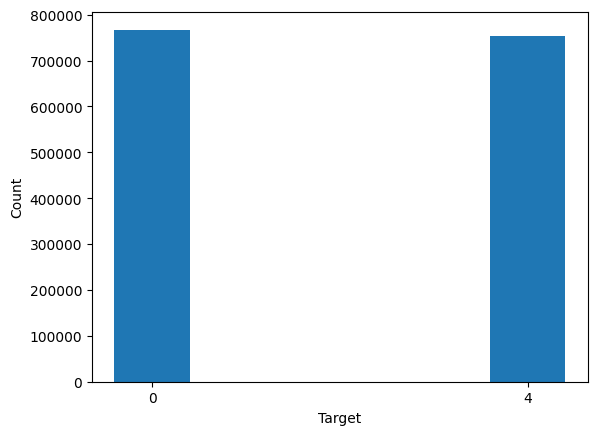

In [22]:
# Sentiments
unique_values = df_16k['target'].unique()
value_counts = df_16k['target'].value_counts()

plt.bar(unique_values, value_counts)
plt.xticks(unique_values)
plt.xlabel('Target')
plt.ylabel('Count')
plt.show()

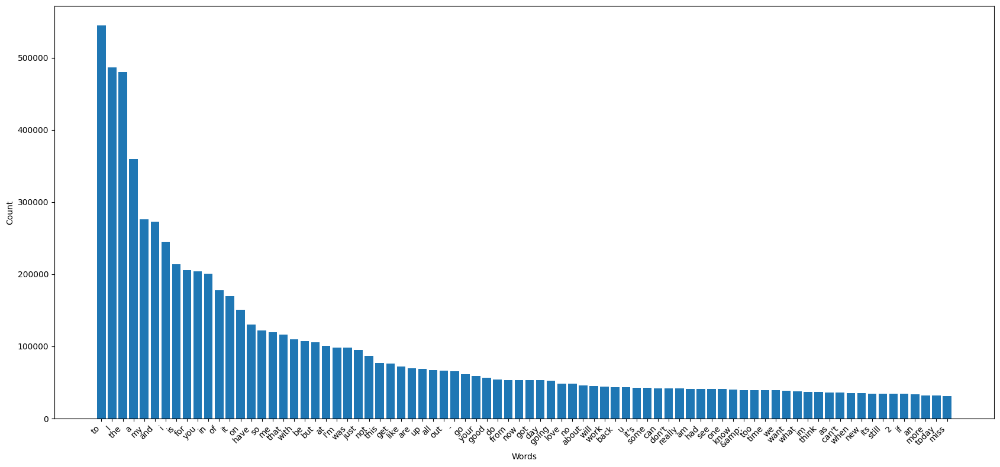

In [23]:
# Top words
word_counts = Counter(" ".join(df_16k['text']).split())
top_words = word_counts.most_common(80)

# Extract word labels and counts
word_labels = [word[0] for word in top_words]
word_counts = [word[1] for word in top_words]

# Plotting the bar plot
plt.figure(figsize=(17, 8))
plt.bar(word_labels, word_counts)
plt.xlabel('Words')
plt.ylabel('Count')
plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.show()

/Users/leonardbrenk/miniconda3/lib/python3.10/site-packages/wordcloud/wordcloud.py:106: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  self.colormap = plt.cm.get_cmap(colormap)


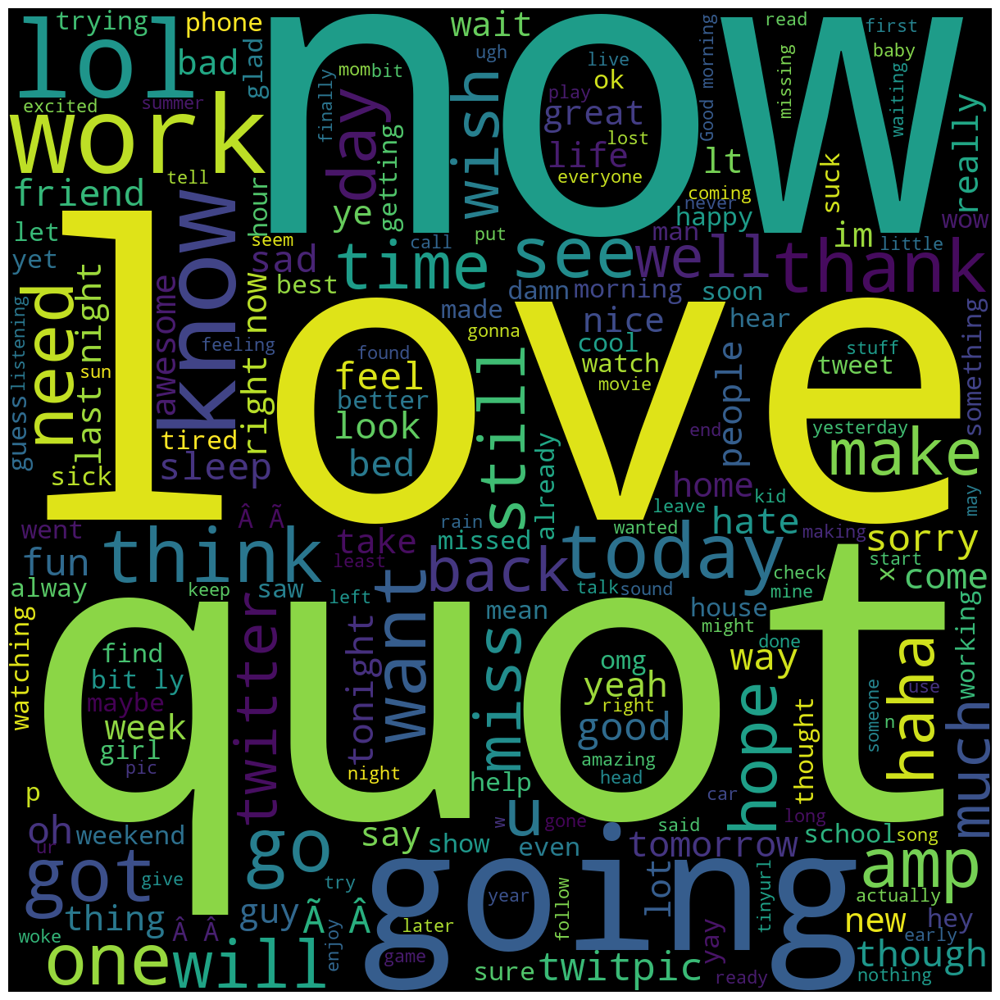

In [24]:
# Wordcloud with top words (excl. stopwords)
text = ' '.join(w for w in df_16k['text'])

wordcloud = WordCloud(width = 1200, height = 1200, background_color = 'black', min_font_size = 10).generate(text)

plt.figure(figsize = (12, 12), facecolor = None) 
plt.imshow(wordcloud) 
plt.axis("off") 
plt.tight_layout(pad = 0) 
#plt.savefig('wordcloud.png')
plt.show()

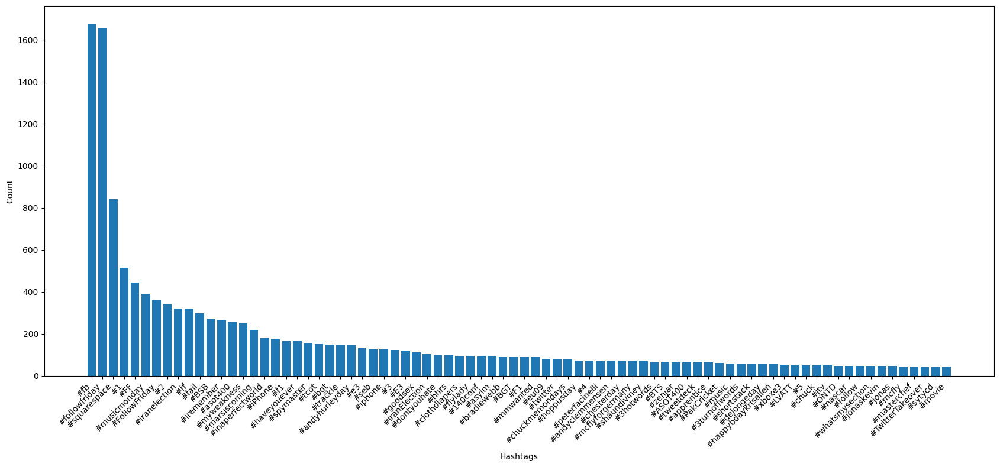

In [25]:
# Top hashtags
hashtags = re.findall(r'#\w+', ' '.join(df_16k['text']))
hashtag_counts = Counter(hashtags)
top_hashtags = hashtag_counts.most_common(80)

# Extract hashtag labels and counts
hashtag_labels = [hashtag[0] for hashtag in top_hashtags]
hashtag_counts = [hashtag[1] for hashtag in top_hashtags]

# Plotting the bar plot
plt.figure(figsize=(17, 8))
plt.bar(hashtag_labels, hashtag_counts)
plt.xlabel('Hashtags')
plt.ylabel('Count')
plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.show()

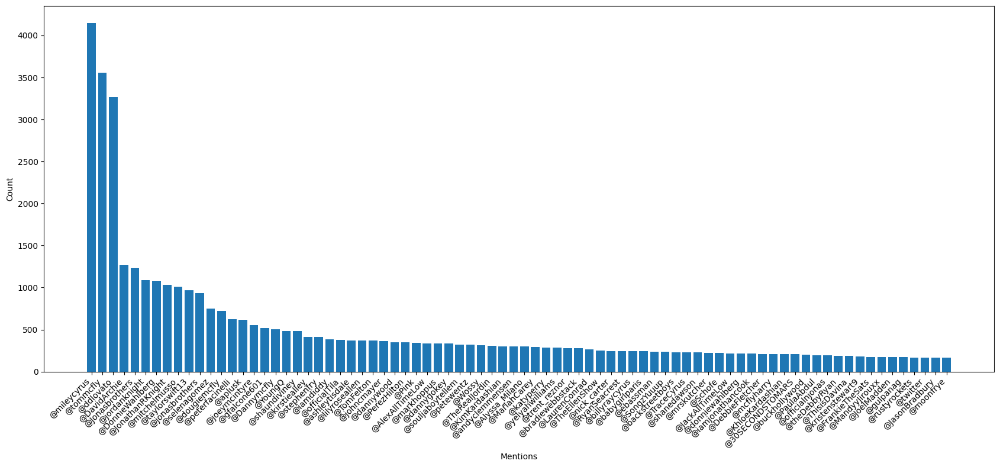

In [26]:
# Top mentions
mentions = re.findall(r'@\w+', ' '.join(df_16k['text']))
mention_counts = Counter(mentions)
top_mentions = mention_counts.most_common(80)

# Extract mention labels and counts
mention_labels = [mention[0] for mention in top_mentions]
mention_counts = [mention[1] for mention in top_mentions]

# Plotting the bar plot
plt.figure(figsize=(17, 8))
plt.bar(mention_labels, mention_counts)
plt.xlabel('Mentions')
plt.ylabel('Count')
plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.show()

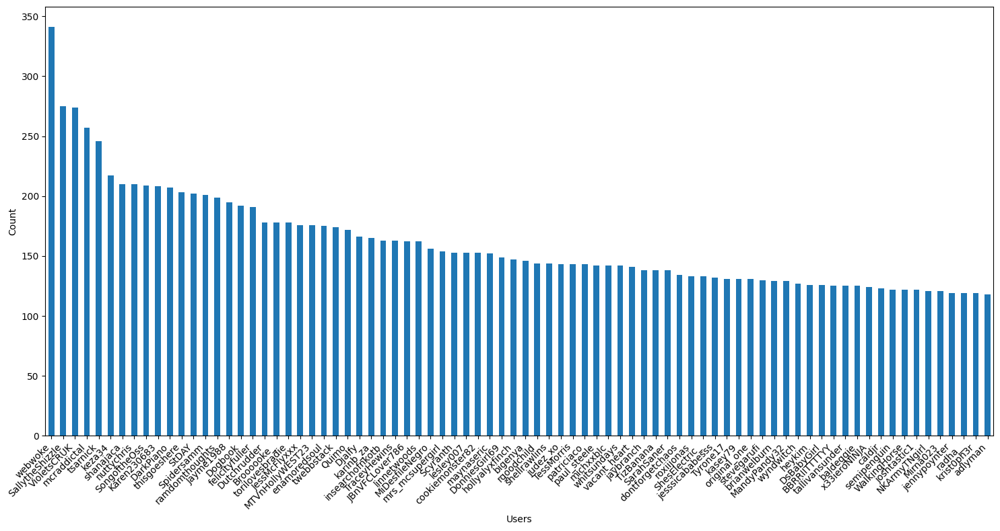

In [27]:
# Top users
user_counts = df_16k['user'].value_counts()
top_users = user_counts.head(80)

# Plotting the bar plot
plt.figure(figsize=(15, 8))
top_users.plot(kind='bar')
plt.xlabel('Users')
plt.ylabel('Count')
plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.show()

/Users/leonardbrenk/miniconda3/lib/python3.10/site-packages/dateutil/parser/_parser.py:1207: UnknownTimezoneWarning: tzname PDT identified but not understood.  Pass `tzinfos` argument in order to correctly return a timezone-aware datetime.  In a future version, this will raise an exception.
  warnings.warn("tzname {tzname} identified but not understood.  "


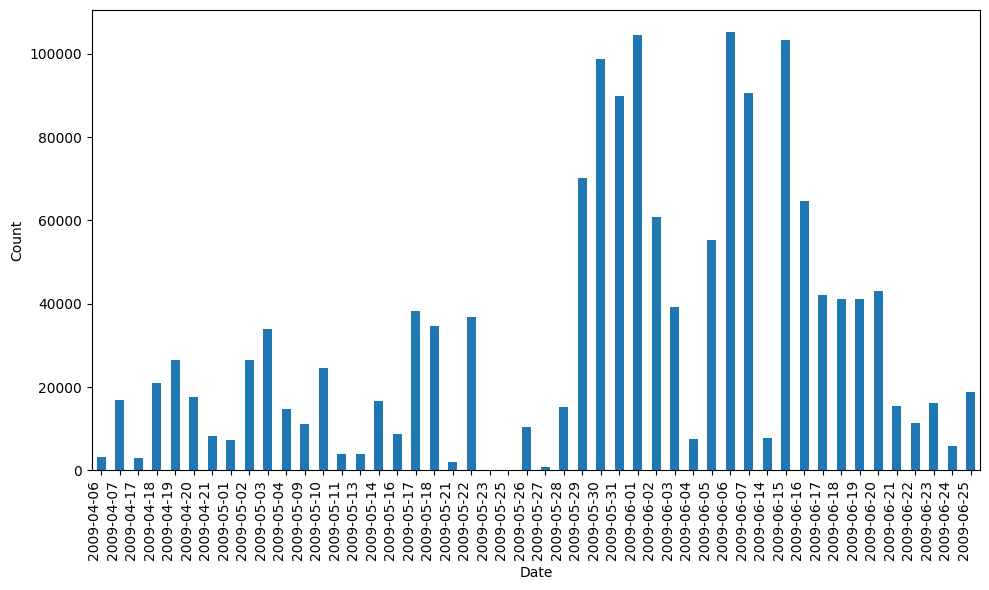

In [28]:
### Visualizing dates
# Get correct date format
df_16k['date'] = df_16k['date'].apply(lambda x: parser.parse(x))

# Convert to date format
df_16k['date'] = pd.to_datetime(df_16k['date'])

# Group dates by day and count occurrences
date_counts = df_16k['date'].dt.date.value_counts().sort_index()

# Plotting the date counts
plt.figure(figsize=(10, 6))
date_counts.plot(kind='bar')
plt.xlabel('Date')
plt.ylabel('Count')
plt.xticks(rotation=90, ha='right')
plt.tight_layout()
plt.show()

##### df_gpt

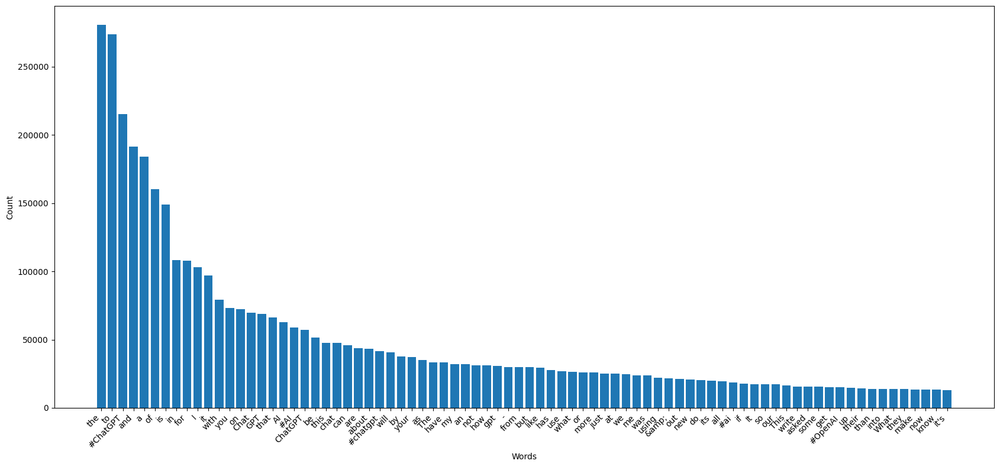

In [29]:
# Top words
word_counts = Counter(" ".join(df_gpt['tweets']).split())
top_words = word_counts.most_common(80)

# Extract word labels and counts
word_labels = [word[0] for word in top_words]
word_counts = [word[1] for word in top_words]

# Plotting the bar plot
plt.figure(figsize=(17, 8))
plt.bar(word_labels, word_counts)
plt.xlabel('Words')
plt.ylabel('Count')
plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.show()

/Users/leonardbrenk/miniconda3/lib/python3.10/site-packages/wordcloud/wordcloud.py:106: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  self.colormap = plt.cm.get_cmap(colormap)


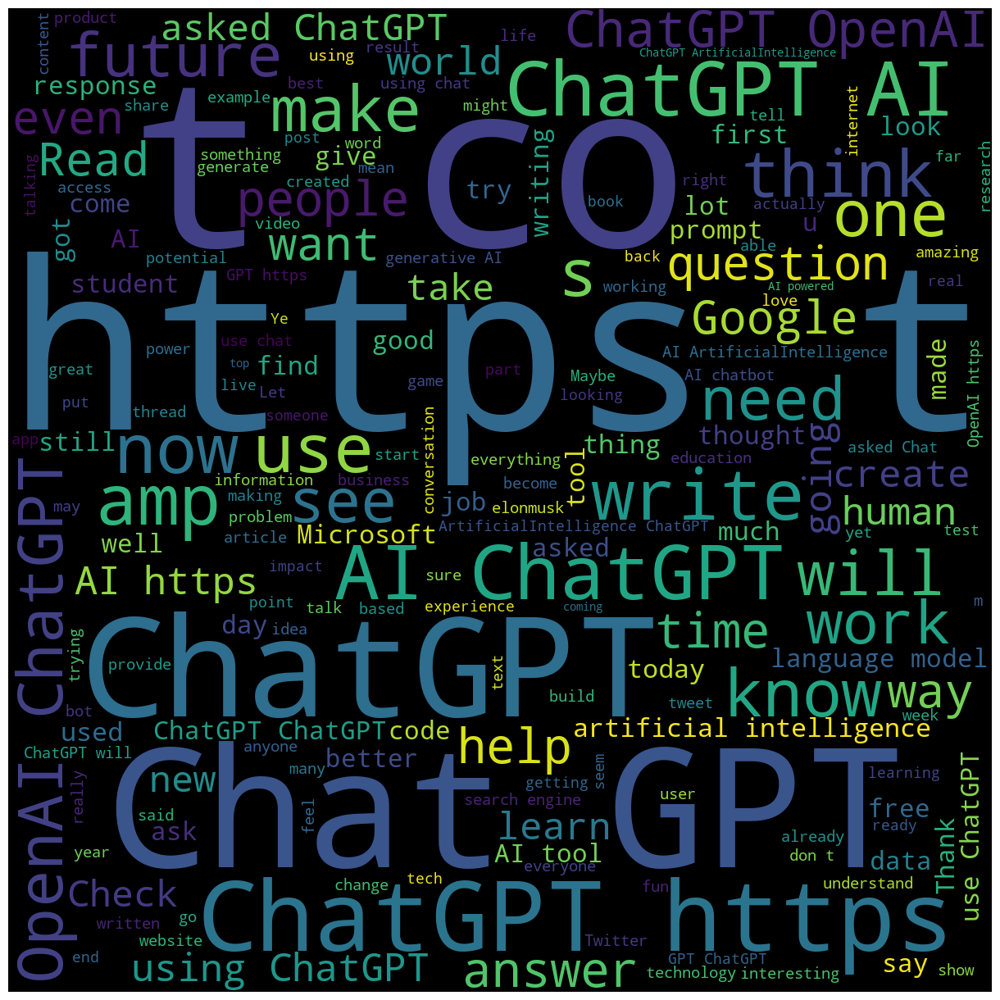

In [30]:
# Wordcloud with top words (excl. stopwords)
text = ' '.join(w for w in df_gpt['tweets'])

wordcloud = WordCloud(width = 1200, height = 1200, background_color = 'black', min_font_size = 10).generate(text)

plt.figure(figsize = (12, 12), facecolor = None) 
plt.imshow(wordcloud) 
plt.axis("off") 
plt.tight_layout(pad = 0) 
#plt.savefig('wordcloud.png')
plt.show()

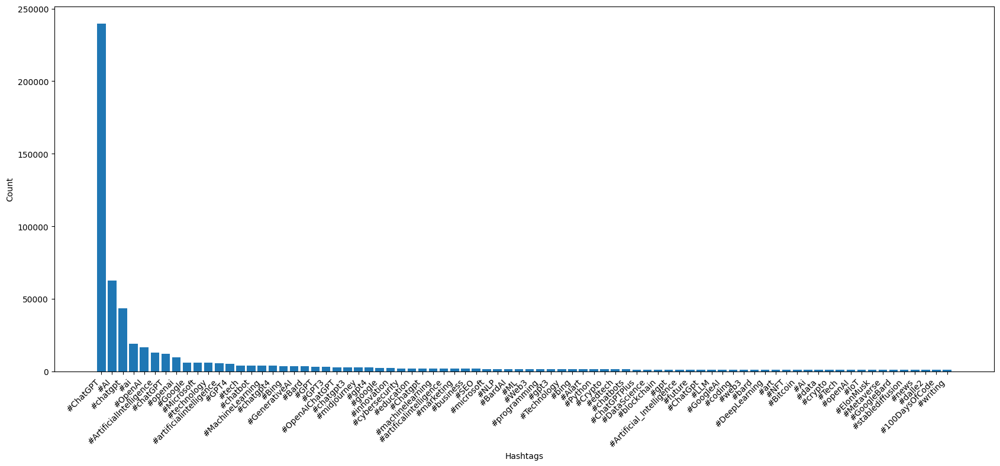

In [31]:
# Top hashtags
hashtags = re.findall(r'#\w+', ' '.join(df_gpt['tweets']))
hashtag_counts = Counter(hashtags)
top_hashtags = hashtag_counts.most_common(80)

# Extract hashtag labels and counts
hashtag_labels = [hashtag[0] for hashtag in top_hashtags]
hashtag_counts = [hashtag[1] for hashtag in top_hashtags]

# Plotting the bar plot
plt.figure(figsize=(17, 8))
plt.bar(hashtag_labels, hashtag_counts)
plt.xlabel('Hashtags')
plt.ylabel('Count')
plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.show()

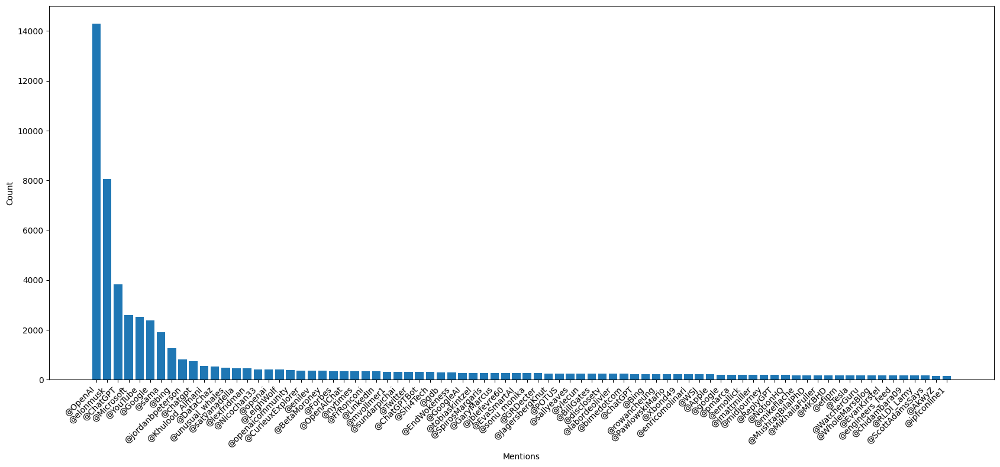

In [32]:
# Top mentions
mentions = re.findall(r'@\w+', ' '.join(df_gpt['tweets']))
mention_counts = Counter(mentions)
top_mentions = mention_counts.most_common(80)

# Extract mention labels and counts
mention_labels = [mention[0] for mention in top_mentions]
mention_counts = [mention[1] for mention in top_mentions]

# Plotting the bar plot
plt.figure(figsize=(17, 8))
plt.bar(mention_labels, mention_counts)
plt.xlabel('Mentions')
plt.ylabel('Count')
plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.show()

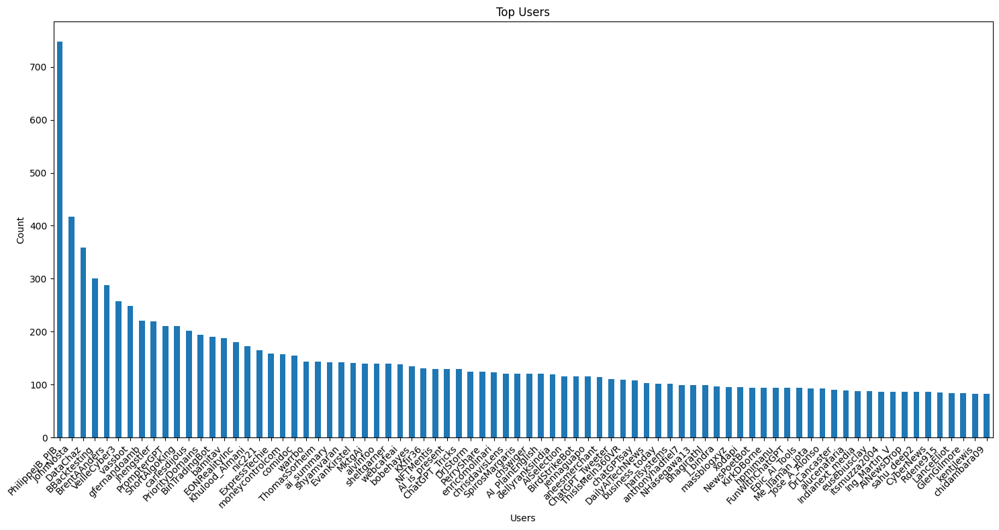

In [33]:
# Top users
user_counts = df_gpt['username'].value_counts()
top_users = user_counts.head(80)

# Plotting the bar plot
plt.figure(figsize=(15, 8))
top_users.plot(kind='bar')
plt.xlabel('Users')
plt.ylabel('Count')
plt.title('Top Users')
plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.show()


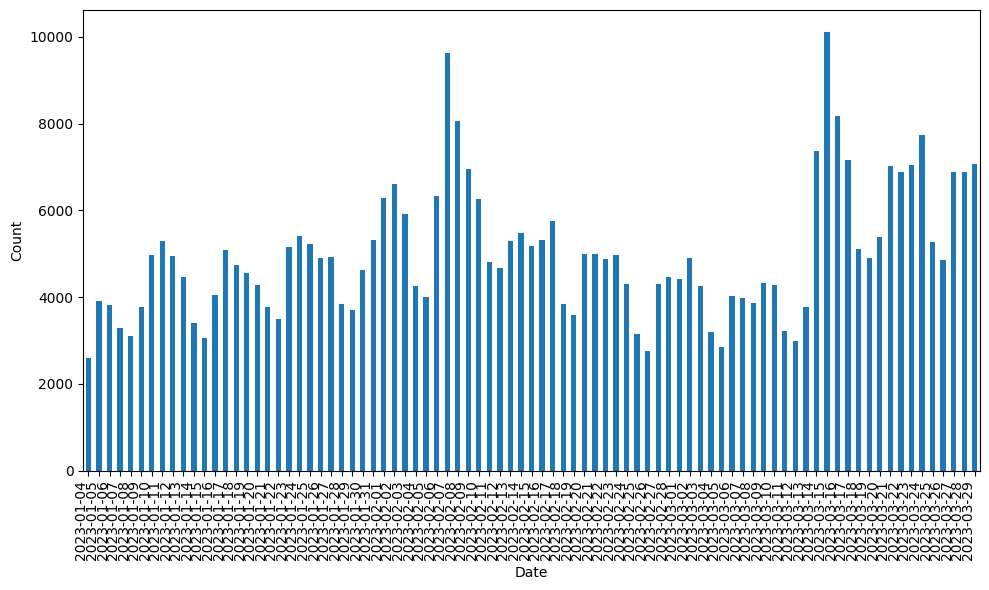

In [34]:
### Visualizing dates
# Filter out non-date values
df_gpt['date'] = df_gpt['date'].str.extract(r'(\d{4}-\d{2}-\d{2} \d{2}:\d{2}:\d{2})')

# Convert date column to datetime format
df_gpt['date'] = pd.to_datetime(df_gpt['date'], format='%Y-%m-%d %H:%M:%S')

# Group dates by day and count occurrences
date_counts = df_gpt['date'].dt.date.value_counts().sort_index()

# Plotting the date counts
plt.figure(figsize=(10, 6))
date_counts.plot(kind='bar')
plt.xlabel('Date')
plt.ylabel('Count')
plt.xticks(rotation=90, ha='right')
plt.tight_layout()
plt.show()

Like Count Statistics:
count    424515.000000
mean          5.859218
std         121.226210
min           0.000000
25%           0.000000
50%           1.000000
75%           2.000000
max       44940.000000
Name: like_count, dtype: float64

Retweet Count Statistics:
count    424515.000000
mean          1.119454
std          21.036257
min           0.000000
25%           0.000000
50%           0.000000
75%           0.000000
max        4835.000000
Name: retweet_count, dtype: float64


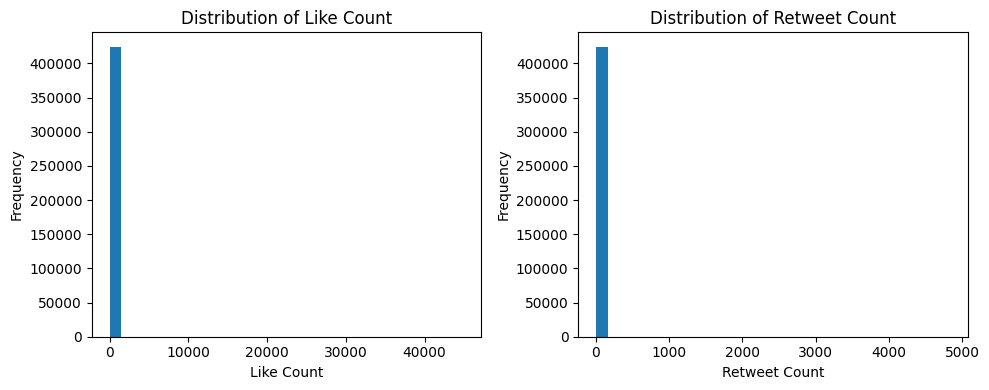

In [35]:
# Like and retweet analysis
like_stats = df_gpt['like_count'].describe()
retweet_stats = df_gpt['retweet_count'].describe()

print("Like Count Statistics:")
print(like_stats)

print("\nRetweet Count Statistics:")
print(retweet_stats)

plt.figure(figsize=(10, 4))

plt.subplot(1, 2, 1)
plt.hist(df_gpt['like_count'], bins=30)
plt.xlabel('Like Count')
plt.ylabel('Frequency')
plt.title('Distribution of Like Count')

plt.subplot(1, 2, 2)
plt.hist(df_gpt['retweet_count'], bins=30)
plt.xlabel('Retweet Count')
plt.ylabel('Frequency')
plt.title('Distribution of Retweet Count')

plt.tight_layout()
plt.show()

##### df_all_topics

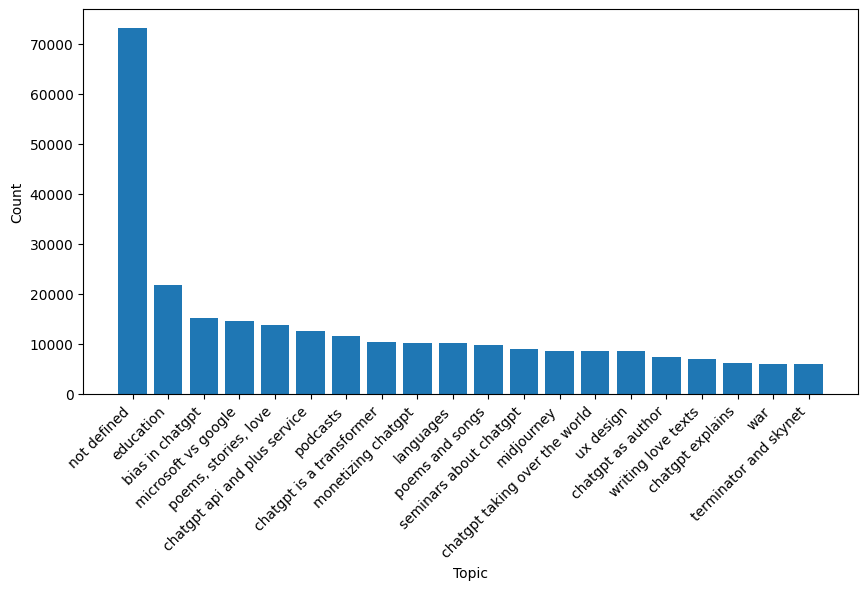

In [36]:
# Topics
unique_values = df_all_topics['topic_name'].unique()
value_counts = df_all_topics['topic_name'].value_counts()

plt.figure(figsize=(10, 5))
plt.bar(unique_values, value_counts)
plt.xticks(unique_values, rotation=45, ha='right')
plt.xlabel('Topic')
plt.ylabel('Count')
plt.show()

# Top2Vec

### No predefined size of documents to include in each topic

In [37]:
# Runs ca. ... minutes with fast-learn option

# create a Top2Vec model
#model = Top2Vec(documents=df_gpt['tweets_preprocessed'].tolist(), document_ids=df_gpt.index.tolist(), speed='fast-learn', workers=16)

# Save the model
# model.save("/Users/aaronwolf/Library/CloudStorage/OneDrive-Personal/Semester_2/NLP/Assignments/top2vec_model_initial")

In [38]:
#model.get_num_topics()
# 4047 topics, very much

In [39]:
#topic_sizes, topic_nums = model.get_topic_sizes()
#print(topic_sizes[:20])
#print(topic_sizes[-20:])

# topics get very small very quickly -> let's try to define the cluster size before we run the model

### Predefined number of documents per topic: 300

In [ ]:
# Adapting the cluster sizes of hdbscan 
# Trains doc2vec model from scratch to create joint word and document embeddings (default)

# Runs ca. 20 minutes with:
min_cluster_size = 300
min_count = 25
speed = "fast-learn"
workers = 16

umap_args = {"random_state":42}
hdbscan_args = {"min_cluster_size":300}
model_300 = Top2Vec(documents=df_gpt['tweets_preprocessed'].tolist(), min_count = 25, document_ids=df_gpt.index.tolist(), speed='fast-learn', workers=16, hdbscan_args=hdbscan_args, umap_args=umap_args)

# Save target model
model_300.save("/Users/leonardbrenk/Downloads/top2vec_model_3001")

In [43]:
# Load target model
model_300 = Top2Vec.load("/Users/leonardbrenk/Downloads/top2vec_model_3001")

In [44]:
# Get number of topics created
model_300.get_num_topics()
# 72 topics

72

In [45]:
# Get number of documents per topic and print the top 11 and bottom 11
topic_sizes, topic_nums = model_300.get_topic_sizes()
print(topic_sizes[:20])
print(topic_sizes[-20:])

# All top topics (the first printed line) have above 5000 documents, nice!

[73242 21756 15317 14702 13864 12570 11724 10387 10269 10259  9846  9111
  8744  8726  8668  7510  6975  6201  6062  5988]
[2115 2012 1991 1930 1846 1840 1763 1586 1479 1421 1288 1277 1127  920
  909  893  776  712  656  623]


In [46]:
# Create df with topics, their words, and word scores
topic_words, word_scores, topic_nums = model_300.get_topics()
df_model_300 = pd.DataFrame({"Topic":topic_nums.tolist(),"topic_words":topic_words.tolist(),"word_scores":word_scores.tolist()})
df_model_300.head(10)

,Topic,topic_words,word_scores
0,0,"[you, it, oto, not, so, do, nmap, but, if, me, what, to, can, is, chat, think, tsls, this, know, really, actually, deliverability, just, now, gpt, all, gainer, the, my, want, give, zftw, that, tab...","[0.3791864812374115, 0.37515372037887573, 0.36764800548553467, 0.36416834592819214, 0.3637634813785553, 0.36309924721717834, 0.3616495728492737, 0.3574976623058319, 0.35448572039604187, 0.35442721..."
1,1,"[students, education, teaching, school, teachers, schools, student, teach, writing, educators, use, should, learning, learn, simpletense, essays, impact, classroom, thinking, cheating, assignments...","[0.49431219696998596, 0.45116978883743286, 0.4326627254486084, 0.42993324995040894, 0.4182908236980438, 0.4060862064361572, 0.40113645792007446, 0.39157989621162415, 0.3888736367225647, 0.38638997..."
2,2,"[biased, bias, woke, programmed, political, not, propaganda, people, is, truth, because, being, it, dangerous, misinformation, that, isn, against, doesn, wrong, they, boycott, whites, biases, left...","[0.5044428706169128, 0.4870835542678833, 0.4620528519153595, 0.4415116310119629, 0.42614084482192993, 0.42088255286216736, 0.40346914529800415, 0.4000590741634369, 0.3930714726448059, 0.3884604573..."
3,3,"[microsoft, announced, openai, bard, powered, launch, chatbot, bing, conversational, launched, rival, engine, google, announces, search, integrate, released, integration, engadget, features, versi...","[0.5231426358222961, 0.5036264657974243, 0.47635942697525024, 0.46202975511550903, 0.45649927854537964, 0.4420273005962372, 0.4359835088253021, 0.427800714969635, 0.4156428873538971, 0.41495770215..."
4,4,"[zftw, love, poem, story, asked, night, life, where, song, man, me, fun, his, the, write, one, come, tell, skies, day, of, blooms, world, movie, so, true, her, was, my, serene, about, this, style,...","[0.4128051996231079, 0.41177040338516235, 0.41144487261772156, 0.4109231233596802, 0.3890475630760193, 0.38540226221084595, 0.38209766149520874, 0.3689420819282532, 0.3653225600719452, 0.363142639..."
5,5,"[api, plus, model, available, openai, version, access, paid, released, per, oto, announced, turbo, month, features, faster, peaking, subscription, nmap, waitlist, microsoft, bing, users, chatgpt, ...","[0.4677959084510803, 0.45719459652900696, 0.4247289001941681, 0.42176616191864014, 0.4156346619129181, 0.41297751665115356, 0.4086141884326935, 0.4081098735332489, 0.4070032238960266, 0.3989010155..."
6,6,"[podcast, episode, listen, discuss, latest, join, watch, talk, impact, miss, chattgpt, discussion, here, tomorrow, check, our, about, zenbe, week, pm, webinar, today, tiffin, implications, hear, v...","[0.506020724773407, 0.4959520995616913, 0.4761134684085846, 0.4406016767024994, 0.42716777324676514, 0.418155699968338, 0.3867844343185425, 0.38479703664779663, 0.3777628540992737, 0.3722994625568..."
7,7,"[transformer, trained, model, language, natural, pre, large, processing, generative, models, developed, conversational, openai, text, architecture, nmap, generate, chattgpt, biogpt, based, applica...","[0.5188764929771423, 0.5132657885551453, 0.5065349340438843, 0.5016196370124817, 0.4672391712665558, 0.4624917805194855, 0.4561608135700226, 0.45058074593544006, 0.4393240511417389, 0.435171633958..."
8,8,"[money, earn, oto, learn, brainbox, make, gainer, tsls, want, ways, zftw, business, chattgpt, free, tabnine, your, online, earns, webcafe, hustles, storylab, month, cybersafecloud, you, earning, d...","[0.5141435861587524, 0.43359890580177307, 0.3780353367328644, 0.3666516840457916, 0.3630327880382538, 0.36297038197517395, 0.3601270020008087, 0.35505014657974243, 0.3548802435398102, 0.3540082275..."
9,9,"[english, translate, text, language, ask, languages, generate, words, correct, writing, then, storylab, write, useful, it, sentence, understand, context, translation, grammar, output, tried, promp...","[0.47334617376327515, 0.42374080419540405, 0.4071914255619049, 0.4056408405303955, 0.40005

/Users/leonardbrenk/miniconda3/lib/python3.10/site-packages/wordcloud/wordcloud.py:106: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  self.colormap = plt.cm.get_cmap(colormap)
/Users/leonardbrenk/miniconda3/lib/python3.10/site-packages/wordcloud/wordcloud.py:106: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  self.colormap = plt.cm.get_cmap(colormap)
/Users/leonardbrenk/miniconda3/lib/python3.10/site-packages/wordcloud/wordcloud.py:106: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instea

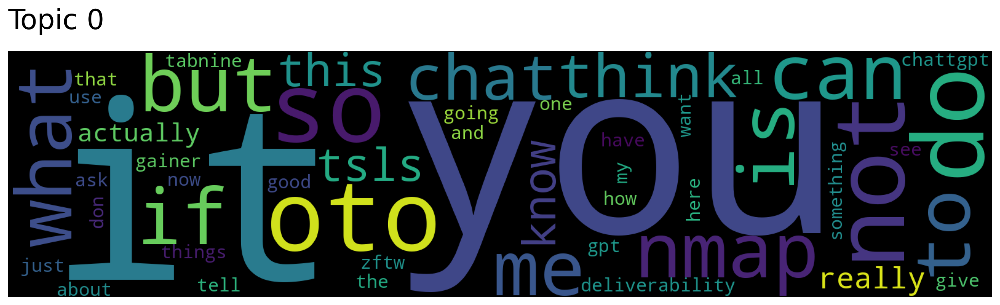

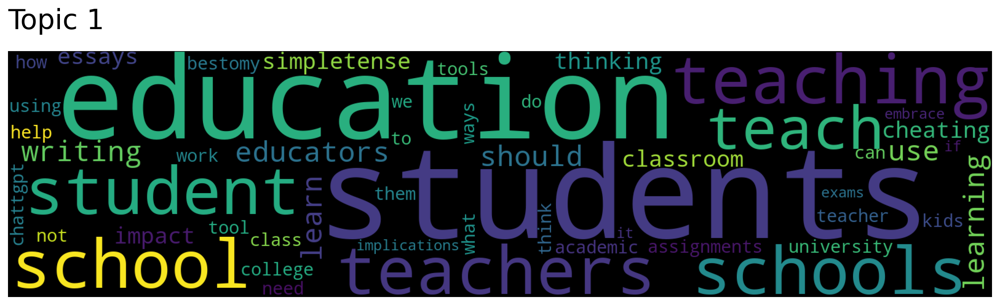

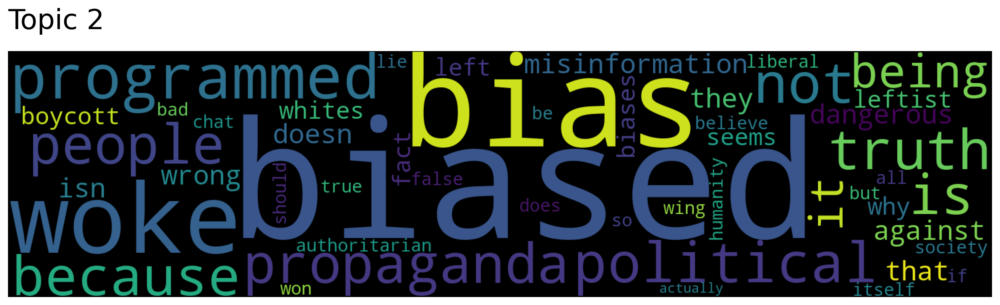

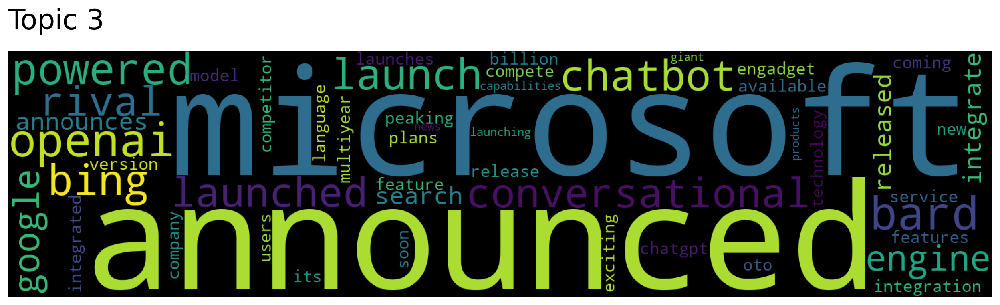

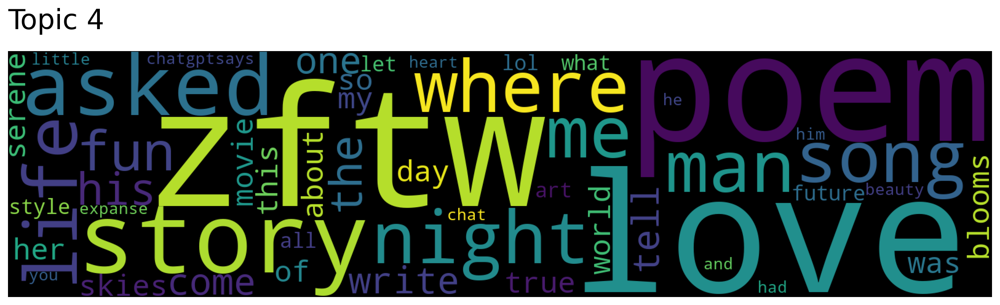

...

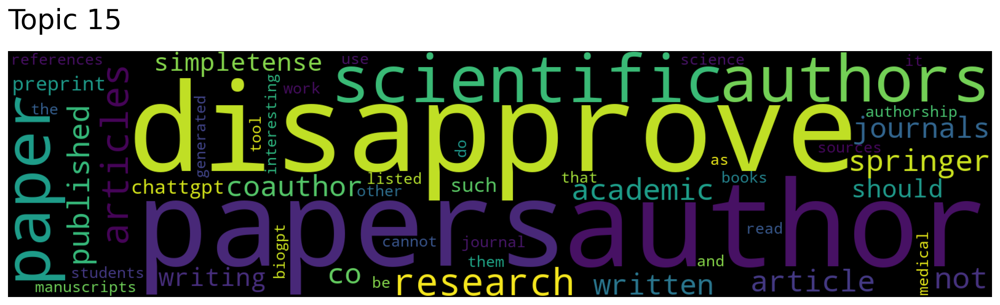

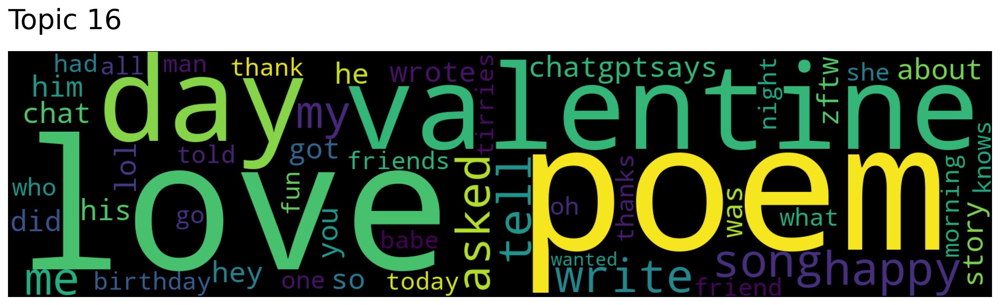

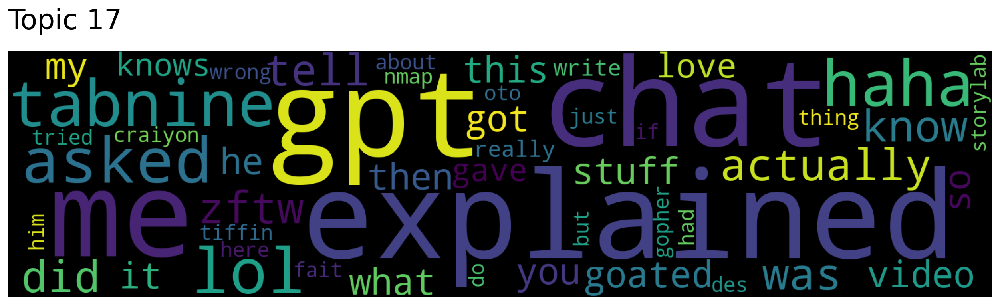

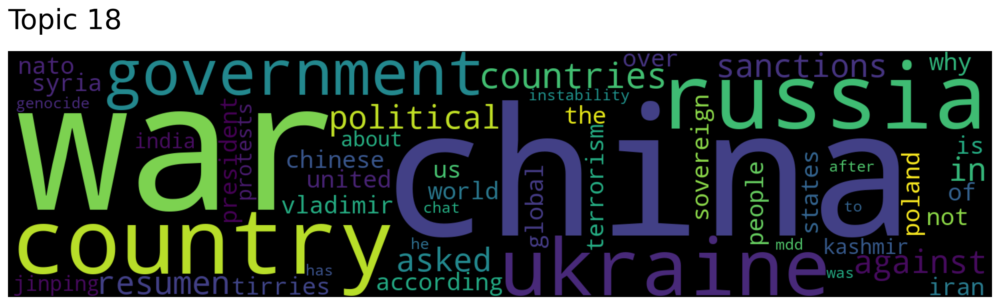

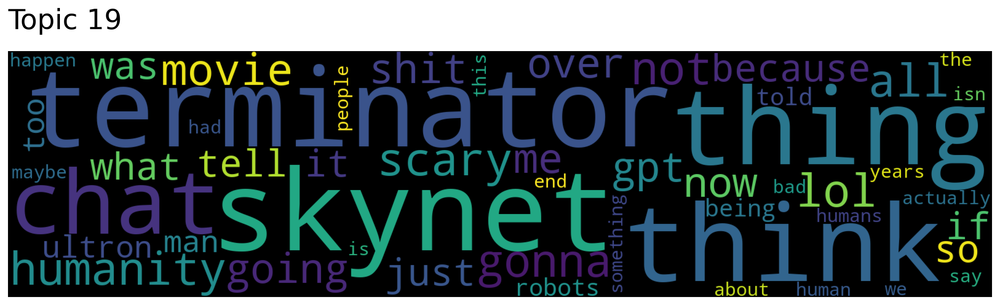

In [47]:
# Generate wordclouds for the first 20 topics to see some patterns
for topic in topic_nums[:20]:
    model_300.generate_topic_wordcloud(topic)

Let's define some topic categories:
- 0: not defined
- 1: education
- 2: bias in chatgpt
- 3: microsoft vs google
- 4: poems / stories / love
- 5: chatgpt api and plus service
- 6: podcasts
- 7: what chatpgt is technically
- 8: how to make money with chatgpt
- 9: languages
- 10: chatgpt writes poems and songs
- 11: seminars about chatgpt
- 12: midjourney
- 13: chatgpt taking over
- 14: ux design
- 15: chatpgt as author
- 16: write love texts
- 17: chatgpt explains
- 18: war
- 19: terminator / skynet

In [48]:
# Looking into documents of a specific topic

# Create function to get documents of a specific topic
def get_topic_documents(topic_num, num_docs = 30):
    print('Getting documents for topic', topic_num)
    print()

    documents, document_scores, document_ids = model_300.search_documents_by_topic(topic_num=topic_num, num_docs=num_docs)
    for doc, score, doc_id in zip(documents, document_scores, document_ids):
        print(f"Document no: {doc_id}")
        print(f"Relevance score: {score}")
        print(f"Content: {doc}")
        print()

# Check documents of one topic
get_topic_documents(14, 100)

Getting documents for topic 14

Document no: 354830
Relevance score: 0.9090983867645264
Content: how i use chatgpt as a ui ux designer by

Document no: 435746
Relevance score: 0.9082384705543518
Content: simple ui ux design by

Document no: 37283
Relevance score: 0.9045717716217041
Content: ai tools for designers ui design ux design chatgpt

Document no: 149321
Relevance score: 0.9033191204071045
Content: how i use chat gpt for ux ui design

Document no: 450835
Relevance score: 0.9028980731964111
Content: how to use chatgpt as a ux ui designer via

Document no: 419192
Relevance score: 0.9023836255073547
Content: how to use chatgpt for ui ux design 25 examples for

Document no: 454213
Relevance score: 0.9022508859634399
Content: follow to learn more about ui ux not

Document no: 130822
Relevance score: 0.9013837575912476
Content: when to use chatgpt for ui ux design read

Document no: 231486
Relevance score: 0.900871992111206
Content: how to use for ui ux design 25 examples

Document no

In [51]:
# Create df with all documents and their topics
all_docs = []
all_topics = []
all_docs_id = []

# topic sizes is an array with all topic sizes, topic nums an array with all topic numbers
topic_sizes, topic_nums = model_300.get_topic_sizes()

# Create df for first 20 topics, assigning the topic number to each document
for i in range(20):
    
    num_docs = topic_sizes[i]
    documents, document_scores, document_ids = model_300.search_documents_by_topic(topic_num=i, num_docs=num_docs)

    for j in range(num_docs):
        all_docs.append(documents[j])
        all_topics.append(i)
        all_docs_id.append(document_ids[j])
    
df_all_topics = pd.DataFrame({'tweets_after_top2vec': all_docs, 'topic': all_topics, 'doc_id': all_docs_id})
df_all_topics

# Assign id column to df_gpt (needed to merge with the topics created by top2vec)
df_gpt['index'] = df_gpt.index

# add original tweets and labels to df with topics
df_all_topics = df_all_topics.merge(df_gpt[['index', 'tweets', 'tweets_preprocessed', 'tweets_without_stopwords', 'lemmatized_tweets']], left_on='doc_id', right_on='index')

# Drop unnecessary columns
df_all_topics.drop('index', axis=1, inplace=True)

# Add titles to topics
topic_mappings = {
    0: "not defined",
    1: "education",
    2: "bias in chatgpt",
    3: "microsoft vs google",
    4: "poems, stories, love",
    5: "chatgpt api and plus service",
    6: "podcasts",
    7: "chatgpt is a transformer",
    8: "monetizing chatgpt",
    9: "languages",
    10: "poems and songs",
    11: "seminars about chatgpt",
    12: "midjourney",
    13: "chatgpt taking over the world",
    14: "ux design",
    15: "chatgpt as author",
    16: "writing love texts",
    17: "chatgpt explains",
    18: "war",
    19: "terminator and skynet"
}

df_all_topics['topic_name'] = df_all_topics['topic'].map(topic_mappings)
df_all_topics.head(30)

,tweets_after_top2vec,topic,doc_id,tweets,tweets_preprocessed,tweets_without_stopwords,lemmatized_tweets,topic_name
0,20 things to do with chatgpt,0,388039,20 things to do with ChatGPT\n\n#ChatGPT #ChatGPTPro #AI #OpenAI #OpenAIChatGPT #OpenAIChat https://t.co/x1Rx5aiZAl,20 things to do with chatgpt,20 things chatgpt,20 thing chatgpt,not defined
1,that s much better,0,50266,That's much better. \n#ChatGPT https://t.co/mrolMvOgms,that s much better,much better,much better,not defined
2,how do i do that,0,196611,How do i do that?\n\n#web #webdev #webdesign #automatisation #ai #community #nocode #indihackers #trends #future #ChatGPT #lowcode #pm #ux #ui #bubble #webflow #airtable #zapier #make #network #vc...,how do i do that,,,not defined
3,did i write this or,0,207945,Did I write this or #ChatGPT ?,did i write this or,write,write,not defined
4,time to,0,391297,Time to #BoycottBuzzfeed\n#AI #ChatGPT #Buzzfeed,time to,time,time,not defined
5,some other fiddlings with,0,385138,some other fiddlings with #chatgpt https://t.co/SCD6JPLUTA,some other fiddlings with,fiddlings,fiddlings,not defined
6,time,0,295867,#ChatGPT time https://t.co/ItQJ6vmUD4,time,time,time,not defined
7,sunflower by chatgpt,0,31793,Sunflower \nby ChatGPT\n\n#AIart #ChatGPT #SVGAIArt #DesignCntrl https://t.co/wPne0OunLq,sunflower by chatgpt,sunflower chatgpt,sunflower chatgpt,not defined
8,something about,0,305579,@catturd2 Something about #ChatGPT ?,something about,something,something,not defined
9,what s all this,0,330325,@Mr_Magic_Bryce @ChatGPT What’s all this ??🤷🏾‍♂️🤷🏾‍♂️🤷🏾‍♂️,what s all this,,,not defined


In [52]:
print(df_all_topics.value_counts('topic_name'))

topic_name
not defined                      73242
education                        21756
bias in chatgpt                  15317
microsoft vs google              14702
poems, stories, love             13864
chatgpt api and plus service     12570
podcasts                         11724
chatgpt is a transformer         10387
monetizing chatgpt               10269
languages                        10259
poems and songs                   9846
seminars about chatgpt            9111
midjourney                        8744
chatgpt taking over the world     8726
ux design                         8668
chatgpt as author                 7510
writing love texts                6975
chatgpt explains                  6201
war                               6062
terminator and skynet             5988
Name: count, dtype: int64


In [ ]:
# Rename columns
df_all_topics.drop("tweets_after_top2vec", axis=1, inplace=True)
df_all_topics = df_all_topics.rename(columns={'doc_id': 'index', 'tweets_without_stopwords': 'tweets_preprocessed_without_stopwords', 'lemmatized_tweets': 'tweets_preprocessed_lemmatized', 'lemmatized_tweets_with_stopwords': 'tweets_preprocessed_lemmatized_with_stopwords'})

### Split into two (one file is too large)
# Determine the midpoint to split the data
splitpoint = len(df_all_topics) // 2

# Split the data into two parts
part1 = df_all_topics[:splitpoint]
part2 = df_all_topics[splitpoint:]

# Write the two parts to separate files
part1.to_csv('df_gpt_including_topics_1.csv', index=False)
part2.to_csv('df_gpt_including_topics_2.csv', index=False)

# LDA

In [55]:
# Create df with only id and tweets column (we have tested this for all different combinations of lemmatization and stop word removal)
documents = df_gpt[['id', 'tweets_without_stopwords']]
documents.head(20)

,id,tweets_without_stopwords
0,1641213230730051584,free ai marketing automation tools strategies collaboration launching new week
1,1641213218520481805,chat gpt says 15
2,1641213115684536323,chat pdf check new ai quickly answers questions pdfs perfect students researchers curious minds
3,1641213110915571715,ai muses court life must face judge destiny jury actions
4,1641213003260633088,people heard chat gpt yet first elite factions decide way go ai safety next push agenda public misleading oversimplified media presentations finally brainless red blue camps screech lines
5,1641212975012016128,chat gpt putting together amazing recipes
6,1641212917868646400,yes also chat gpt make generative art easy needs code knowledge post resently article matter take look
8,1641212856984109072,robotically shaun usher letters note think reading many steamy romance novels
9,1641212845441585152,metaphor limited perception reality many people experience used add depth complexity film themes
10,1641212842828533761,anyone familiar cave allegory allegory plato describes group people chained inside cave see shadows cast wall front


In [56]:
# Create function to tokenize text
def preprocess(text):
    result = []
    for token in gensim.utils.simple_preprocess(text):
        if token not in gensim.parsing.preprocessing.STOPWORDS and len(token) > 3:
            result.append(token)
    return result

# Tokenized texts
processed_docs = documents['tweets_without_stopwords'].map(preprocess) # exchange to relevant column you want to test
print(len(processed_docs))
processed_docs[:10]

424532


0                                                                                                    [free, marketing, automation, tools, strategies, collaboration, launching, week]
1                                                                                                                                                                        [chat, says]
2                                                                                    [chat, check, quickly, answers, questions, pdfs, perfect, students, researchers, curious, minds]
3                                                                                                                           [muses, court, life, face, judge, destiny, jury, actions]
4     [people, heard, chat, elite, factions, decide, safety, push, agenda, public, misleading, oversimplified, media, presentations, finally, brainless, blue, camps, screech, lines]
5                                                                                         

In [57]:
# Create a dictionary from ‘processed_docs’ containing the number of times a word appears in the training set.
dictionary = gensim.corpora.Dictionary(processed_docs)
print('Number of unique words BOW dictionary:', len(dictionary))

# Most frequent words
count = 0
for k, v in dictionary.iteritems():
    print(k, v)
    count += 1
    if count > 10:
        break

Number of unique words BOW dictionary: 91337
0 automation
1 collaboration
2 free
3 launching
4 marketing
5 strategies
6 tools
7 week
8 chat
9 says
10 answers


In [58]:
# Filter out words that appear in less than 15 documents (absolute number) or more than 10% of the documents (to reduce noise).
dictionary.filter_extremes(no_below=15, no_above=0.1, keep_n=100000)
print(len(dictionary.iteritems())) # 14338 words remain

13251


In [59]:
# create a bag of words corpus for the LDA, containing for each document the number of times each word appears in it
bow_corpus = [dictionary.doc2bow(doc) for doc in processed_docs]
print('length of corpus = documents included: ', len(bow_corpus))
print()

# Print example with document with id = 0
bow_doc_0 = bow_corpus[0]

print('Dictionary for document 0: ')
print(bow_doc_0)
print()

for i in range(len(bow_doc_0)): # for every tuple in the bow
    print("Word {} (\"{}\") appears {} time.".format(bow_doc_0[i][0], # print the encoded word
                                                     dictionary[bow_doc_0[i][0]], # print the decoded word
                                                     bow_doc_0[i][1])) # print the number of times the word appears


length of corpus = documents included:  424532

Dictionary for document 0: 
[(0, 1), (1, 1), (2, 1), (3, 1), (4, 1), (5, 1), (6, 1), (7, 1)]

Word 0 ("automation") appears 1 time.
Word 1 ("collaboration") appears 1 time.
Word 2 ("free") appears 1 time.
Word 3 ("launching") appears 1 time.
Word 4 ("marketing") appears 1 time.
Word 5 ("strategies") appears 1 time.
Word 6 ("tools") appears 1 time.
Word 7 ("week") appears 1 time.


In [60]:
#Compute TF-IDF by multiplying term frequency with inverse document frequency and normalizing the resulting docs to unit length
tfidf = models.TfidfModel(bow_corpus)

# apply tidf model to the corpus
corpus_tfidf = tfidf[bow_corpus]

# print the first document of the transformed corpus
print(corpus_tfidf[0])

[(0, 0.3891338065729298), (1, 0.44148699233062516), (2, 0.2588017044579025), (3, 0.41351664206904126), (4, 0.3060136439289082), (5, 0.4184039109984747), (6, 0.24935962254209207), (7, 0.29121019268347464)]


In [61]:
# Create LDA model with 10 topics
lda_model_10 = gensim.models.LdaMulticore(bow_corpus,
                                       num_topics=10, 
                                       id2word=dictionary,
                                       passes=6, 
                                       workers=16,
                                       random_state=42)

# Create LDA model with 20 topics
lda_model_20 = gensim.models.LdaMulticore(bow_corpus,
                                       num_topics=20, 
                                       id2word=dictionary,
                                       passes=6, 
                                       workers=16,
                                       random_state=42)

# # Create LDA model with 30 topics
lda_model_30 = gensim.models.LdaMulticore(bow_corpus,
                                       num_topics=30, 
                                       id2word=dictionary,
                                       passes=6, 
                                       workers=16,
                                       random_state=42)

In [62]:
coherence_model_lda10 = CoherenceModel(model=lda_model_10, texts=processed_docs, dictionary=dictionary, coherence='c_v')
coherence_lda10 = coherence_model_lda10.get_coherence()
print('Coherence Score model_10: ', coherence_lda10)

coherence_model_lda20 = CoherenceModel(model=lda_model_20, texts=processed_docs, dictionary=dictionary, coherence='c_v')
coherence_lda20 = coherence_model_lda20.get_coherence()
print('Coherence Score model_20: ', coherence_lda20)

coherence_model_lda30 = CoherenceModel(model=lda_model_30, texts=processed_docs, dictionary=dictionary, coherence='c_v')
coherence_lda30 = coherence_model_lda30.get_coherence()
print('Coherence Score model_30: ', coherence_lda30)

# tweets_preprocessed
# Coherence Score model_10:  0.45813746531912464
# Coherence Score model_20:  0.46383922942774125
# Coherence Score model_30:  0.44432658217614196

# tweets_without_stopwords
# Coherence Score model_10:  0.4870459402070235
# Coherence Score model_20:  0.4659174572483396
# Coherence Score model_30:  0.43640313383393026

# tweets_lemmatized (without stopwords)
# Coherence Score model_10:  0.47294277074762103
# Coherence Score model_20:  0.46176652463378015
# Coherence Score model_30:  0.4268833777888872

# lemmatized_tweets_with_stopwords
# Coherence Score model_10:  0.45790897777325024
# Coherence Score model_20:  0.4447959397036899
# Coherence Score model_30:  0.4379306845617809

Coherence Score model_10:  0.4917315493874998
Coherence Score model_20:  0.47059796157110023
Coherence Score model_30:  0.4290421754907832


##### Evaluate lda_model_10

In [63]:
# Visualize the topics
# Be aware that the topic integer labels are different in the pyLDAvis visualization than in the 'normal' LDA model.
# -> Check the top words to match the topics in the visualization with the ones generated in the LDA model.
%matplotlib inline
vis = pyLDAvis.gensim_models.prepare(lda_model_10, bow_corpus, dictionary)
pyLDAvis.enable_notebook()
pyLDAvis.display(vis)

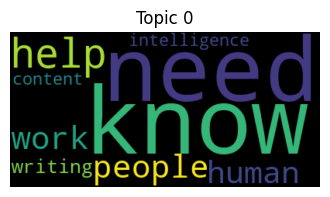

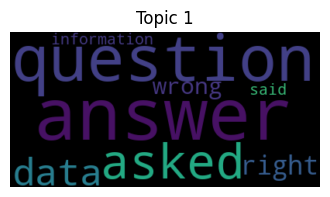

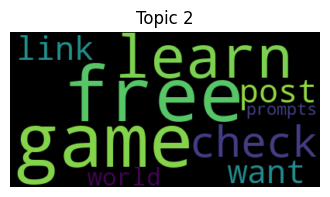

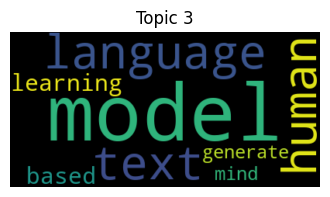

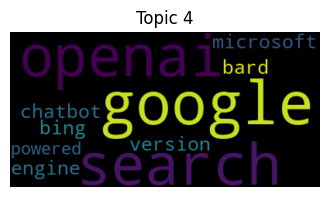

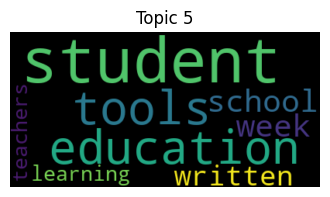

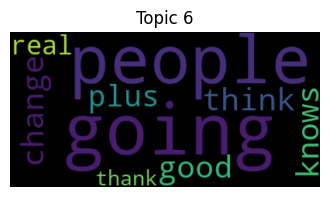

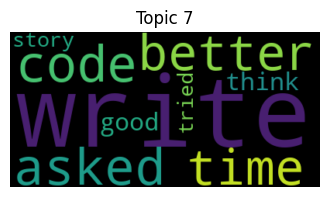

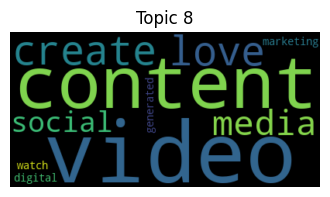

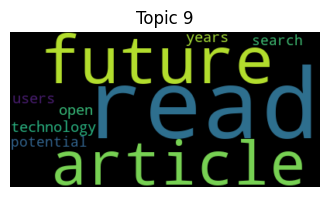

In [64]:
import warnings

def fxn():
    warnings.warn("deprecated", DeprecationWarning)

with warnings.catch_warnings():
    warnings.simplefilter("ignore")

    for idx, topic in lda_model_10.print_topics(-1):

        #print('Topic: {} \nWords: {}'.format(idx, topic))

        # Extract the words from the topic
        words = topic.split('"')[1::2]

        # Create a word cloud from the extracted words
        wordcloud = WordCloud().generate(' '.join(words))

        # Display the word cloud
        plt.figure(figsize=(4, 4))
        plt.imshow(wordcloud, interpolation='bilinear')
        plt.axis('off')
        plt.title(f"Topic {idx}")
        # plt.savefig(f"topic_{idx}_wordcloud.png")  # Save the word cloud as an image
        plt.show()


###### Topics:
# 0, 2, 6, 9 --> not defined
# creating video content (8)

# Top2Vec
# - 0: not defined
# - 1: education                       --> education (5)
# - 2: bias in chatgpt
# - 3: microsoft vs google              --> google vs microsoft (4)
# - 4: poems / stories / love
# - 5: chatgpt api and plus service
# - 6: podcasts
# - 7: what chatpgt is technically     --> chatgpt is a LLM (3)
# - 8: how to make money with chatgpt
# - 9: languages
# - 10: chatgpt writes poems and songs  --> chatgpt writes (7)
# - 11: seminars about chatgpt
# - 12: midjourney
# - 13: chatgpt taking over
# - 14: ux design
# - 15: chatpgt as author
# - 16: write love texts
# - 17: chatgpt explains                -> chatgpt answering questions (1)
# - 18: war
# - 19: terminator / skynet

In [65]:
## Assign topics to the documents (takes approximately 2:30 minutes)

# Initialize an empty list to store dataframe rows
rows = []

# Iterate over each document in the corpus
for i, doc in enumerate(processed_docs):
    # Convert the document from tokens to string
    doc_text = ' '.join(doc)
    
    # Get the document's topic distribution
    doc_topics = lda_model_10.get_document_topics(corpus_tfidf[i])
    
    # Sort the topics by their probability in descending order
    sorted_topics = sorted(doc_topics, key=lambda x: x[1], reverse=True)
    
    # Get the dominant topic (the one with the highest probability)
    dominant_topic = sorted_topics[0][0]
    
    # Append the document and its assigned topic as a dictionary to the rows list
    rows.append({'Document': doc_text, 'Topic': dominant_topic})

# Create the dataframe using pd.concat()
df_all_topics_lda = pd.concat([pd.DataFrame(rows[i], index=[i]) for i in range(len(rows))])

In [66]:
# Sort the df by topic and show it
df_all_topics_lda = df_all_topics_lda.sort_values(by=['Topic'])
df_all_topics_lda

,Document,Topic
343145,chat correct texts journey create cover picture concept thought machine point leaving technical machine human jobs human qualities creativity,0
345286,thanks perspective believe share central theme going forward humans humans,0
209270,important uses chat uses chat technology include necessary important things daily lives people chat technology questions comes mind,0
209272,imagine cancelling dave chappelle chat thing need cancelled,0
66050,things creative walk timer write ideas time read different book genres conversations interesting people avoid chat,0
...,...,...
84794,email aged rapid world coming microsoft word ready,9
345259,chatgpt looming threat horizon mythical creature ready swoop gobble jobs truth impact workplace read,9
345257,impact,9
345270,market expected rise significantly forecast period rising power declining costs widespread adoption based technology read,9


In [67]:
df_all_topics_lda['Topic'].value_counts()

Topic
7    58428
0    52835
1    50545
6    45116
4    39637
2    37480
9    37308
5    35986
8    35340
3    31857
Name: count, dtype: int64

In [68]:
# Explore one topic at a time
i = 9
df_all_topics_lda[df_all_topics_lda['Topic'] == i].head(40)
# df_all_topics_lda[df_all_topics_lda['Topic'] == i].tail(40)

,Document,Topic
41150,according days droughtlander,9
55104,comfortable open chat typically phone browser comfortable chat growing threat google search business,9
262585,record time thank leaderboard rank,9
242306,challenged write series tweets discusses current future water shortage crisis threatens including vulnerable areas mitigation strategies help deal response,9
332659,possible looming decide,9
408850,food thought widely excel transform society massively increase emissions,9
409309,chatgpt cybercriminals hacking fraud,9
262745,read chatgpt future,9
38603,open chat,9
264505,speculate similar services impact people search information entities create content retailers need adapt purchasing trends largely knows unprecedented unpredictable future automation,9


##### Evaluate lda_model_20

In [69]:
# Visualize the topics
%matplotlib inline
vis = pyLDAvis.gensim_models.prepare(lda_model_20, bow_corpus, dictionary)
pyLDAvis.enable_notebook()
pyLDAvis.display(vis)

Topic: 0 
Words: 0.099*"know" + 0.055*"need" + 0.027*"help" + 0.024*"people" + 0.020*"money" + 0.016*"ideas" + 0.014*"things" + 0.013*"think" + 0.013*"want" + 0.008*"guys"



/Users/leonardbrenk/miniconda3/lib/python3.10/site-packages/wordcloud/wordcloud.py:106: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  self.colormap = plt.cm.get_cmap(colormap)


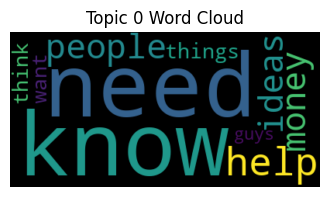

Topic: 1 
Words: 0.041*"answer" + 0.029*"questions" + 0.024*"right" + 0.022*"question" + 0.019*"wrong" + 0.019*"answers" + 0.014*"asked" + 0.012*"data" + 0.008*"correct" + 0.008*"asking"



/Users/leonardbrenk/miniconda3/lib/python3.10/site-packages/wordcloud/wordcloud.py:106: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  self.colormap = plt.cm.get_cmap(colormap)


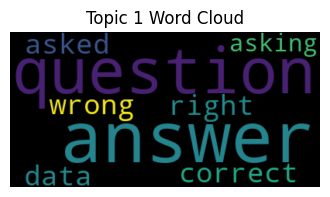

Topic: 2 
Words: 0.038*"free" + 0.016*"like" + 0.016*"link" + 0.013*"want" + 0.012*"check" + 0.012*"prompts" + 0.012*"join" + 0.012*"follow" + 0.011*"episode" + 0.011*"learn"



/Users/leonardbrenk/miniconda3/lib/python3.10/site-packages/wordcloud/wordcloud.py:106: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  self.colormap = plt.cm.get_cmap(colormap)


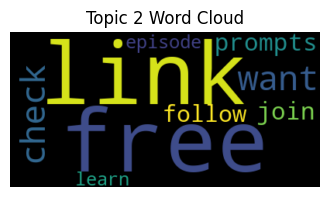

Topic: 3 
Words: 0.029*"students" + 0.020*"prompt" + 0.018*"text" + 0.014*"thread" + 0.010*"words" + 0.010*"twitter" + 0.010*"teachers" + 0.010*"woke" + 0.009*"step" + 0.009*"ways"



/Users/leonardbrenk/miniconda3/lib/python3.10/site-packages/wordcloud/wordcloud.py:106: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  self.colormap = plt.cm.get_cmap(colormap)


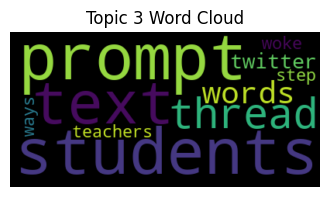

Topic: 4 
Words: 0.060*"intelligence" + 0.051*"artificial" + 0.031*"human" + 0.025*"says" + 0.021*"jobs" + 0.011*"msft" + 0.011*"generative" + 0.010*"like" + 0.008*"according" + 0.007*"fine"



/Users/leonardbrenk/miniconda3/lib/python3.10/site-packages/wordcloud/wordcloud.py:106: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  self.colormap = plt.cm.get_cmap(colormap)


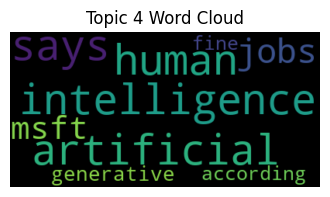

Topic: 5 
Words: 0.038*"written" + 0.020*"tools" + 0.020*"like" + 0.017*"wrote" + 0.012*"pretty" + 0.011*"hope" + 0.011*"bots" + 0.010*"book" + 0.010*"going" + 0.008*"stuff"



/Users/leonardbrenk/miniconda3/lib/python3.10/site-packages/wordcloud/wordcloud.py:106: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  self.colormap = plt.cm.get_cmap(colormap)


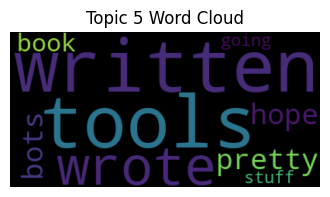

Topic: 6 
Words: 0.020*"plus" + 0.018*"access" + 0.015*"month" + 0.013*"paid" + 0.013*"available" + 0.013*"exam" + 0.011*"wait" + 0.010*"medical" + 0.008*"plan" + 0.008*"version"



/Users/leonardbrenk/miniconda3/lib/python3.10/site-packages/wordcloud/wordcloud.py:106: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  self.colormap = plt.cm.get_cmap(colormap)


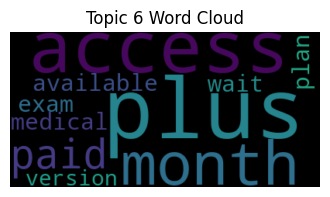

Topic: 7 
Words: 0.061*"asked" + 0.030*"better" + 0.025*"write" + 0.020*"story" + 0.019*"tell" + 0.015*"response" + 0.012*"results" + 0.009*"email" + 0.009*"short" + 0.008*"script"



/Users/leonardbrenk/miniconda3/lib/python3.10/site-packages/wordcloud/wordcloud.py:106: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  self.colormap = plt.cm.get_cmap(colormap)


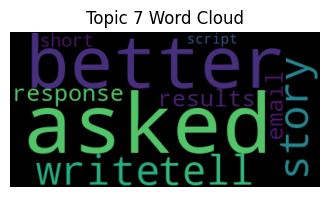

Topic: 8 
Words: 0.023*"create" + 0.021*"video" + 0.019*"social" + 0.019*"media" + 0.014*"watch" + 0.012*"project" + 0.012*"build" + 0.012*"design" + 0.010*"created" + 0.009*"building"



/Users/leonardbrenk/miniconda3/lib/python3.10/site-packages/wordcloud/wordcloud.py:106: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  self.colormap = plt.cm.get_cmap(colormap)


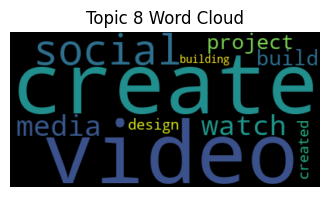

Topic: 9 
Words: 0.054*"read" + 0.044*"article" + 0.029*"open" + 0.029*"post" + 0.028*"blog" + 0.019*"users" + 0.016*"check" + 0.015*"months" + 0.015*"latest" + 0.015*"years"



/Users/leonardbrenk/miniconda3/lib/python3.10/site-packages/wordcloud/wordcloud.py:106: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  self.colormap = plt.cm.get_cmap(colormap)


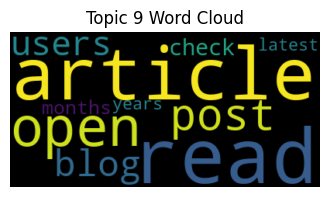

Topic: 10 
Words: 0.049*"openai" + 0.041*"microsoft" + 0.040*"bing" + 0.040*"search" + 0.022*"chatbot" + 0.018*"engine" + 0.017*"powered" + 0.017*"version" + 0.010*"billion" + 0.010*"company"



/Users/leonardbrenk/miniconda3/lib/python3.10/site-packages/wordcloud/wordcloud.py:106: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  self.colormap = plt.cm.get_cmap(colormap)


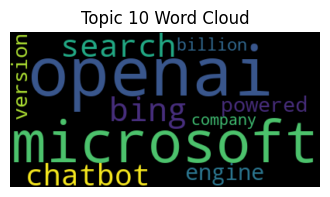

Topic: 11 
Words: 0.061*"write" + 0.032*"writing" + 0.030*"like" + 0.014*"code" + 0.012*"thanks" + 0.012*"thought" + 0.012*"knows" + 0.011*"asked" + 0.011*"style" + 0.010*"poem"



/Users/leonardbrenk/miniconda3/lib/python3.10/site-packages/wordcloud/wordcloud.py:106: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  self.colormap = plt.cm.get_cmap(colormap)


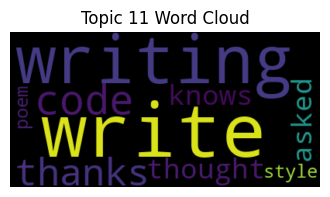

Topic: 12 
Words: 0.023*"technology" + 0.023*"future" + 0.015*"tech" + 0.014*"world" + 0.014*"potential" + 0.011*"market" + 0.011*"industry" + 0.010*"impact" + 0.009*"business" + 0.009*"like"



/Users/leonardbrenk/miniconda3/lib/python3.10/site-packages/wordcloud/wordcloud.py:106: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  self.colormap = plt.cm.get_cmap(colormap)


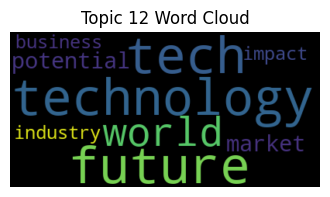

Topic: 13 
Words: 0.045*"language" + 0.032*"model" + 0.018*"models" + 0.017*"like" + 0.015*"data" + 0.014*"text" + 0.013*"information" + 0.012*"responses" + 0.012*"generate" + 0.012*"human"



/Users/leonardbrenk/miniconda3/lib/python3.10/site-packages/wordcloud/wordcloud.py:106: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  self.colormap = plt.cm.get_cmap(colormap)


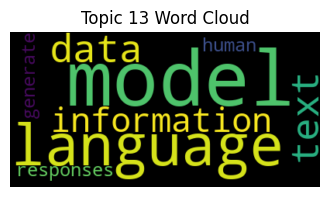

Topic: 14 
Words: 0.027*"world" + 0.022*"education" + 0.020*"learning" + 0.017*"change" + 0.015*"school" + 0.013*"year" + 0.010*"students" + 0.010*"real" + 0.010*"schools" + 0.009*"going"



/Users/leonardbrenk/miniconda3/lib/python3.10/site-packages/wordcloud/wordcloud.py:106: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  self.colormap = plt.cm.get_cmap(colormap)


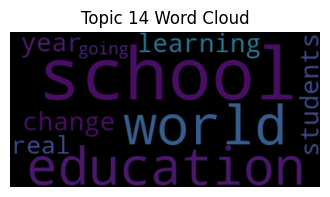

Topic: 15 
Words: 0.060*"time" + 0.026*"love" + 0.021*"like" + 0.014*"thing" + 0.011*"talking" + 0.010*"trying" + 0.010*"good" + 0.010*"people" + 0.009*"long" + 0.008*"robot"



/Users/leonardbrenk/miniconda3/lib/python3.10/site-packages/wordcloud/wordcloud.py:106: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  self.colormap = plt.cm.get_cmap(colormap)


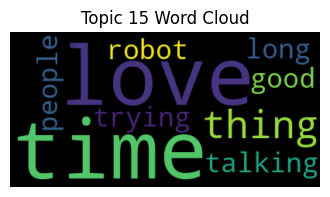

Topic: 16 
Words: 0.143*"google" + 0.034*"bard" + 0.030*"code" + 0.021*"search" + 0.012*"threat" + 0.010*"rival" + 0.009*"live" + 0.008*"race" + 0.008*"competitor" + 0.007*"copilot"



/Users/leonardbrenk/miniconda3/lib/python3.10/site-packages/wordcloud/wordcloud.py:106: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  self.colormap = plt.cm.get_cmap(colormap)


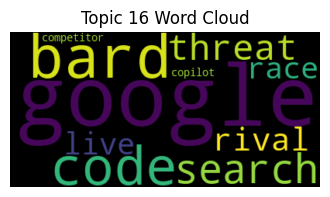

Topic: 17 
Words: 0.036*"game" + 0.021*"tweet" + 0.016*"mind" + 0.012*"working" + 0.012*"idea" + 0.011*"changer" + 0.011*"like" + 0.010*"coding" + 0.010*"tried" + 0.010*"think"



/Users/leonardbrenk/miniconda3/lib/python3.10/site-packages/wordcloud/wordcloud.py:106: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  self.colormap = plt.cm.get_cmap(colormap)


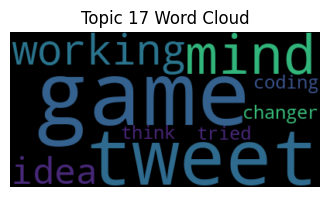

Topic: 18 
Words: 0.048*"content" + 0.017*"work" + 0.015*"help" + 0.014*"tools" + 0.014*"good" + 0.011*"tool" + 0.010*"tasks" + 0.009*"productivity" + 0.009*"business" + 0.009*"quality"



/Users/leonardbrenk/miniconda3/lib/python3.10/site-packages/wordcloud/wordcloud.py:106: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  self.colormap = plt.cm.get_cmap(colormap)


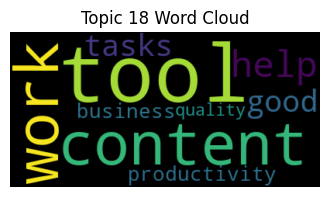

Topic: 19 
Words: 0.040*"replace" + 0.022*"said" + 0.018*"looking" + 0.014*"hype" + 0.014*"forward" + 0.013*"humans" + 0.013*"look" + 0.013*"think" + 0.011*"going" + 0.009*"human"



/Users/leonardbrenk/miniconda3/lib/python3.10/site-packages/wordcloud/wordcloud.py:106: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  self.colormap = plt.cm.get_cmap(colormap)


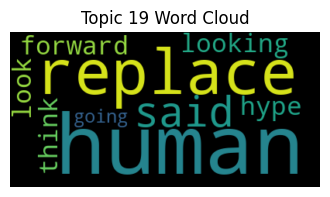

In [70]:
# Wordclouds for most frequent words
for idx, topic in lda_model_20.print_topics(-1):
    print('Topic: {} \nWords: {}'.format(idx, topic))
    print()

    # Extract the words from the topic
    words = topic.split('"')[1::2]

    # Create a word cloud from the extracted words
    wordcloud = WordCloud(colormap=plt.colormaps['viridis']).generate(' '.join(words))

    # Display the word cloud
    plt.figure(figsize=(4, 4))
    plt.imshow(wordcloud, interpolation='bilinear')
    plt.axis('off')
    plt.title(f"Topic {idx} Word Cloud")
    plt.show()

##### Evaluate lda_model_30

In [71]:
# Visualize the topics
%matplotlib inline
vis = pyLDAvis.gensim_models.prepare(lda_model_30, bow_corpus, dictionary)
pyLDAvis.enable_notebook()
pyLDAvis.display(vis)

Topic: 0 
Words: 0.121*"know" + 0.070*"need" + 0.027*"help" + 0.023*"ideas" + 0.021*"business" + 0.017*"think" + 0.017*"people" + 0.015*"want" + 0.013*"things" + 0.012*"guys"



/Users/leonardbrenk/miniconda3/lib/python3.10/site-packages/wordcloud/wordcloud.py:106: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  self.colormap = plt.cm.get_cmap(colormap)


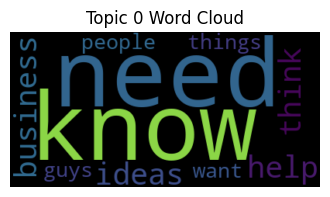

Topic: 1 
Words: 0.053*"right" + 0.026*"prompt" + 0.016*"building" + 0.014*"left" + 0.012*"interesting" + 0.011*"close" + 0.011*"list" + 0.010*"second" + 0.010*"great" + 0.010*"cases"



/Users/leonardbrenk/miniconda3/lib/python3.10/site-packages/wordcloud/wordcloud.py:106: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  self.colormap = plt.cm.get_cmap(colormap)


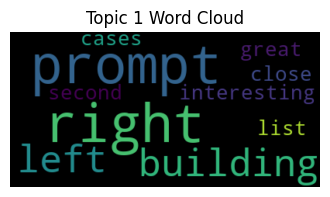

Topic: 2 
Words: 0.037*"free" + 0.029*"video" + 0.029*"learn" + 0.022*"link" + 0.018*"prompts" + 0.014*"follow" + 0.014*"watch" + 0.014*"check" + 0.014*"youtube" + 0.013*"episode"



/Users/leonardbrenk/miniconda3/lib/python3.10/site-packages/wordcloud/wordcloud.py:106: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  self.colormap = plt.cm.get_cmap(colormap)


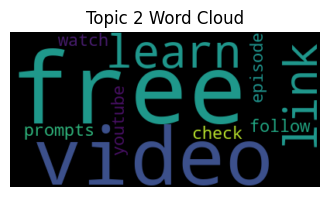

Topic: 3 
Words: 0.045*"students" + 0.020*"text" + 0.017*"school" + 0.017*"teachers" + 0.016*"step" + 0.014*"student" + 0.013*"capacity" + 0.013*"woke" + 0.013*"elon" + 0.013*"schools"



/Users/leonardbrenk/miniconda3/lib/python3.10/site-packages/wordcloud/wordcloud.py:106: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  self.colormap = plt.cm.get_cmap(colormap)


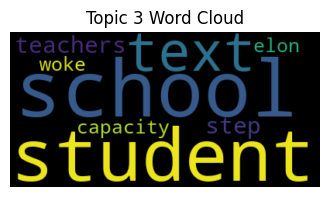

Topic: 4 
Words: 0.038*"jobs" + 0.034*"says" + 0.021*"human" + 0.012*"thoughts" + 0.010*"replaced" + 0.009*"happen" + 0.009*"replace" + 0.008*"like" + 0.008*"report" + 0.008*"according"



/Users/leonardbrenk/miniconda3/lib/python3.10/site-packages/wordcloud/wordcloud.py:106: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  self.colormap = plt.cm.get_cmap(colormap)


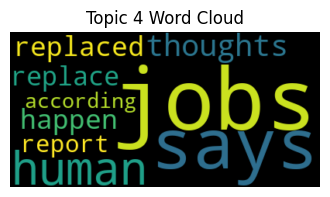

Topic: 5 
Words: 0.045*"written" + 0.037*"tools" + 0.028*"wrote" + 0.024*"pretty" + 0.017*"awesome" + 0.016*"like" + 0.015*"course" + 0.011*"worried" + 0.010*"books" + 0.008*"stock"



/Users/leonardbrenk/miniconda3/lib/python3.10/site-packages/wordcloud/wordcloud.py:106: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  self.colormap = plt.cm.get_cmap(colormap)


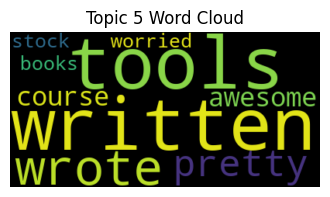

Topic: 6 
Words: 0.029*"knows" + 0.015*"medical" + 0.014*"guess" + 0.010*"reality" + 0.008*"views" + 0.007*"black" + 0.006*"stack" + 0.006*"mark" + 0.006*"trending" + 0.006*"exam"



/Users/leonardbrenk/miniconda3/lib/python3.10/site-packages/wordcloud/wordcloud.py:106: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  self.colormap = plt.cm.get_cmap(colormap)


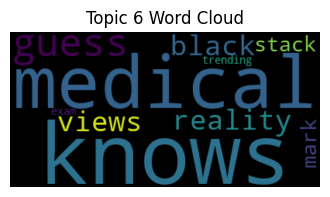

Topic: 7 
Words: 0.053*"asked" + 0.041*"write" + 0.032*"tell" + 0.032*"story" + 0.024*"better" + 0.019*"short" + 0.017*"email" + 0.013*"copy" + 0.011*"stories" + 0.009*"script"



/Users/leonardbrenk/miniconda3/lib/python3.10/site-packages/wordcloud/wordcloud.py:106: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  self.colormap = plt.cm.get_cmap(colormap)


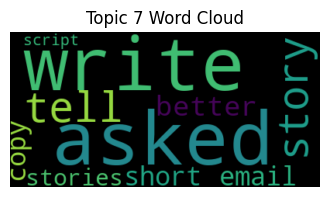

Topic: 8 
Words: 0.071*"content" + 0.047*"create" + 0.026*"social" + 0.026*"media" + 0.014*"creation" + 0.013*"generated" + 0.013*"marketing" + 0.012*"created" + 0.010*"music" + 0.009*"posts"



/Users/leonardbrenk/miniconda3/lib/python3.10/site-packages/wordcloud/wordcloud.py:106: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  self.colormap = plt.cm.get_cmap(colormap)


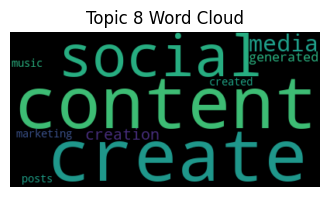

Topic: 9 
Words: 0.081*"future" + 0.041*"open" + 0.030*"years" + 0.025*"work" + 0.016*"source" + 0.012*"rate" + 0.011*"education" + 0.010*"welcome" + 0.010*"smarter" + 0.009*"think"



/Users/leonardbrenk/miniconda3/lib/python3.10/site-packages/wordcloud/wordcloud.py:106: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  self.colormap = plt.cm.get_cmap(colormap)


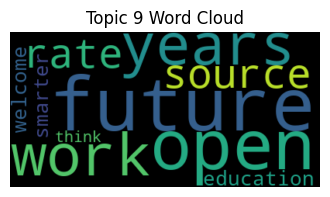

Topic: 10 
Words: 0.057*"openai" + 0.054*"microsoft" + 0.047*"search" + 0.046*"bing" + 0.032*"chatbot" + 0.023*"powered" + 0.021*"engine" + 0.014*"version" + 0.013*"google" + 0.011*"launch"



/Users/leonardbrenk/miniconda3/lib/python3.10/site-packages/wordcloud/wordcloud.py:106: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  self.colormap = plt.cm.get_cmap(colormap)


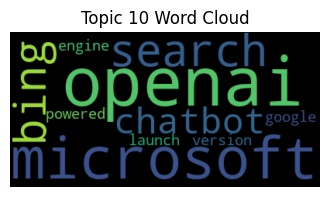

Topic: 11 
Words: 0.063*"write" + 0.027*"like" + 0.022*"asked" + 0.020*"maybe" + 0.018*"thank" + 0.017*"poem" + 0.016*"style" + 0.014*"writing" + 0.013*"song" + 0.010*"think"



/Users/leonardbrenk/miniconda3/lib/python3.10/site-packages/wordcloud/wordcloud.py:106: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  self.colormap = plt.cm.get_cmap(colormap)


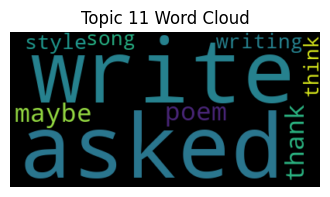

Topic: 12 
Words: 0.033*"technology" + 0.017*"tech" + 0.017*"world" + 0.016*"potential" + 0.013*"industry" + 0.012*"impact" + 0.012*"research" + 0.011*"future" + 0.007*"ahead" + 0.007*"market"



/Users/leonardbrenk/miniconda3/lib/python3.10/site-packages/wordcloud/wordcloud.py:106: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  self.colormap = plt.cm.get_cmap(colormap)


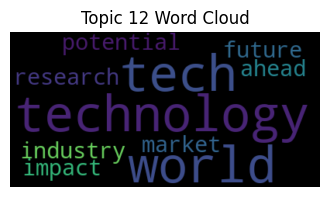

Topic: 13 
Words: 0.062*"language" + 0.045*"model" + 0.026*"models" + 0.023*"text" + 0.019*"generate" + 0.018*"like" + 0.016*"responses" + 0.015*"large" + 0.015*"human" + 0.013*"based"



/Users/leonardbrenk/miniconda3/lib/python3.10/site-packages/wordcloud/wordcloud.py:106: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  self.colormap = plt.cm.get_cmap(colormap)


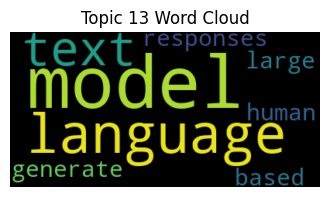

Topic: 14 
Words: 0.035*"year" + 0.023*"days" + 0.023*"machine" + 0.021*"current" + 0.016*"gonna" + 0.014*"times" + 0.014*"crypto" + 0.013*"learning" + 0.011*"parameters" + 0.011*"trust"



/Users/leonardbrenk/miniconda3/lib/python3.10/site-packages/wordcloud/wordcloud.py:106: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  self.colormap = plt.cm.get_cmap(colormap)


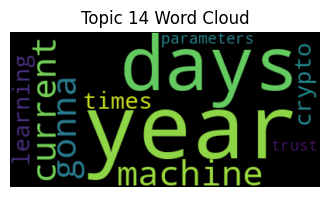

Topic: 15 
Words: 0.128*"time" + 0.046*"love" + 0.017*"save" + 0.016*"play" + 0.011*"scary" + 0.011*"hours" + 0.010*"like" + 0.009*"long" + 0.008*"cover" + 0.008*"spent"



/Users/leonardbrenk/miniconda3/lib/python3.10/site-packages/wordcloud/wordcloud.py:106: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  self.colormap = plt.cm.get_cmap(colormap)


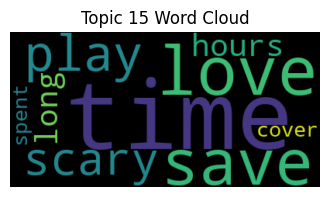

Topic: 16 
Words: 0.090*"code" + 0.052*"game" + 0.026*"world" + 0.021*"change" + 0.016*"changer" + 0.015*"live" + 0.014*"coding" + 0.014*"python" + 0.013*"changing" + 0.009*"developer"



/Users/leonardbrenk/miniconda3/lib/python3.10/site-packages/wordcloud/wordcloud.py:106: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  self.colormap = plt.cm.get_cmap(colormap)


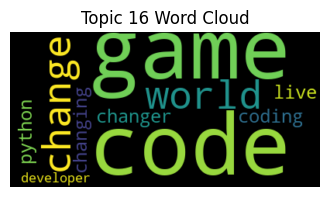

Topic: 17 
Words: 0.037*"tweet" + 0.019*"image" + 0.019*"tried" + 0.017*"finally" + 0.017*"write" + 0.014*"funny" + 0.013*"idea" + 0.010*"based" + 0.009*"asked" + 0.008*"description"



/Users/leonardbrenk/miniconda3/lib/python3.10/site-packages/wordcloud/wordcloud.py:106: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  self.colormap = plt.cm.get_cmap(colormap)


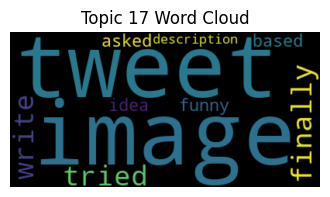

Topic: 18 
Words: 0.019*"help" + 0.016*"improve" + 0.015*"tasks" + 0.015*"good" + 0.014*"ways" + 0.014*"work" + 0.013*"productivity" + 0.012*"tools" + 0.012*"customer" + 0.010*"business"



/Users/leonardbrenk/miniconda3/lib/python3.10/site-packages/wordcloud/wordcloud.py:106: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  self.colormap = plt.cm.get_cmap(colormap)


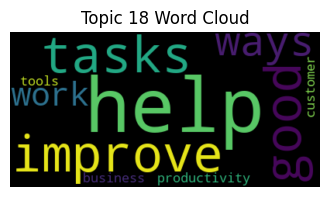

Topic: 19 
Words: 0.046*"replace" + 0.040*"said" + 0.024*"humans" + 0.020*"looking" + 0.019*"forward" + 0.008*"human" + 0.008*"credit" + 0.008*"going" + 0.007*"lately" + 0.007*"tech"



/Users/leonardbrenk/miniconda3/lib/python3.10/site-packages/wordcloud/wordcloud.py:106: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  self.colormap = plt.cm.get_cmap(colormap)


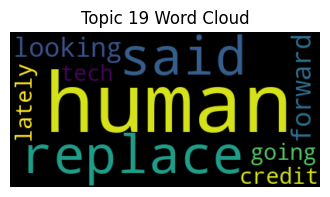

Topic: 20 
Words: 0.024*"mind" + 0.023*"soon" + 0.019*"msft" + 0.018*"extension" + 0.017*"coming" + 0.015*"going" + 0.014*"chrome" + 0.014*"update" + 0.012*"working" + 0.011*"blowing"



/Users/leonardbrenk/miniconda3/lib/python3.10/site-packages/wordcloud/wordcloud.py:106: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  self.colormap = plt.cm.get_cmap(colormap)


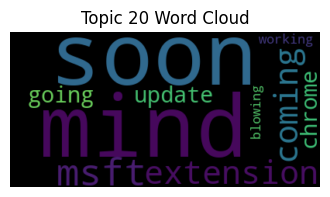

Topic: 21 
Words: 0.049*"read" + 0.048*"article" + 0.044*"post" + 0.039*"blog" + 0.034*"check" + 0.023*"latest" + 0.020*"problem" + 0.017*"super" + 0.015*"today" + 0.014*"problems"



/Users/leonardbrenk/miniconda3/lib/python3.10/site-packages/wordcloud/wordcloud.py:106: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  self.colormap = plt.cm.get_cmap(colormap)


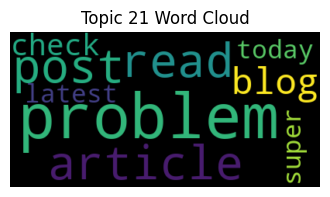

Topic: 22 
Words: 0.041*"users" + 0.023*"plus" + 0.023*"months" + 0.022*"month" + 0.020*"million" + 0.016*"available" + 0.016*"paid" + 0.012*"free" + 0.011*"access" + 0.010*"days"



/Users/leonardbrenk/miniconda3/lib/python3.10/site-packages/wordcloud/wordcloud.py:106: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  self.colormap = plt.cm.get_cmap(colormap)


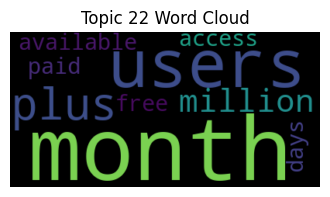

Topic: 23 
Words: 0.086*"like" + 0.027*"human" + 0.023*"looks" + 0.022*"news" + 0.014*"real" + 0.010*"health" + 0.010*"think" + 0.009*"feels" + 0.009*"world" + 0.008*"robots"



/Users/leonardbrenk/miniconda3/lib/python3.10/site-packages/wordcloud/wordcloud.py:106: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  self.colormap = plt.cm.get_cmap(colormap)


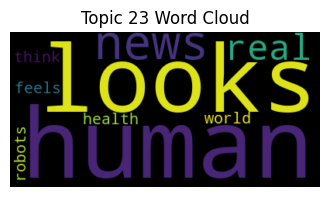

Topic: 24 
Words: 0.162*"google" + 0.044*"bard" + 0.030*"search" + 0.020*"actually" + 0.012*"like" + 0.009*"better" + 0.009*"competitor" + 0.008*"page" + 0.008*"rival" + 0.008*"away"



/Users/leonardbrenk/miniconda3/lib/python3.10/site-packages/wordcloud/wordcloud.py:106: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  self.colormap = plt.cm.get_cmap(colormap)


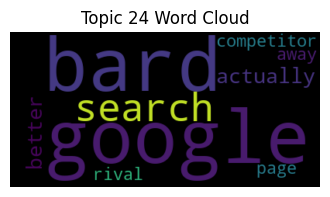

Topic: 25 
Words: 0.057*"data" + 0.038*"generative" + 0.034*"thanks" + 0.022*"training" + 0.021*"trained" + 0.014*"fine" + 0.013*"train" + 0.010*"tuned" + 0.009*"points" + 0.008*"agree"



/Users/leonardbrenk/miniconda3/lib/python3.10/site-packages/wordcloud/wordcloud.py:106: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  self.colormap = plt.cm.get_cmap(colormap)


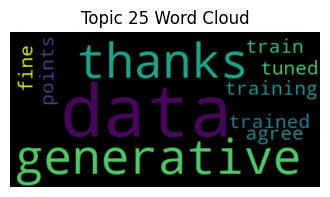

Topic: 26 
Words: 0.112*"intelligence" + 0.096*"artificial" + 0.015*"talks" + 0.010*"breaking" + 0.010*"truth" + 0.009*"startup" + 0.009*"damn" + 0.008*"case" + 0.008*"human" + 0.007*"chatbot"



/Users/leonardbrenk/miniconda3/lib/python3.10/site-packages/wordcloud/wordcloud.py:106: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  self.colormap = plt.cm.get_cmap(colormap)


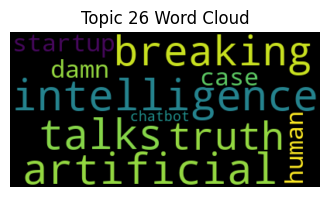

Topic: 27 
Words: 0.055*"people" + 0.033*"money" + 0.029*"access" + 0.026*"internet" + 0.015*"online" + 0.015*"crazy" + 0.013*"account" + 0.013*"like" + 0.009*"think" + 0.008*"author"



/Users/leonardbrenk/miniconda3/lib/python3.10/site-packages/wordcloud/wordcloud.py:106: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  self.colormap = plt.cm.get_cmap(colormap)


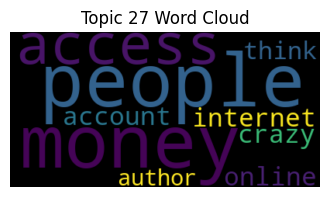

Topic: 28 
Words: 0.058*"answer" + 0.051*"questions" + 0.042*"question" + 0.033*"answers" + 0.030*"asked" + 0.022*"asking" + 0.017*"wrong" + 0.014*"response" + 0.013*"like" + 0.011*"correct"



/Users/leonardbrenk/miniconda3/lib/python3.10/site-packages/wordcloud/wordcloud.py:106: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  self.colormap = plt.cm.get_cmap(colormap)


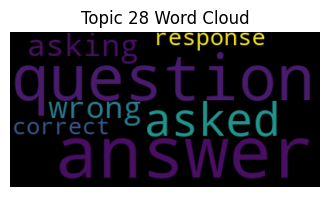

Topic: 29 
Words: 0.027*"thinking" + 0.026*"join" + 0.017*"cool" + 0.016*"discussion" + 0.014*"thing" + 0.011*"critical" + 0.009*"people" + 0.009*"ethical" + 0.008*"dangerous" + 0.007*"today"



/Users/leonardbrenk/miniconda3/lib/python3.10/site-packages/wordcloud/wordcloud.py:106: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  self.colormap = plt.cm.get_cmap(colormap)


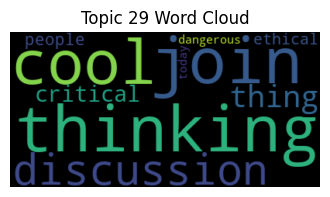

In [72]:
# Wordclouds for most frequent words
for idx, topic in lda_model_30.print_topics(-1):
    print('Topic: {} \nWords: {}'.format(idx, topic))
    print()

    # Extract the words from the topic
    words = topic.split('"')[1::2]

    # Create a word cloud from the extracted words
    wordcloud = WordCloud(colormap=plt.colormaps['viridis']).generate(' '.join(words))

    # Display the word cloud
    plt.figure(figsize=(4, 4))
    plt.imshow(wordcloud, interpolation='bilinear')
    plt.axis('off')
    plt.title(f"Topic {idx} Word Cloud")
    plt.show()

# VADER Sentiment Analysis

In [73]:
# Load the first part of the CSV file
#df_gpt1 = pd.read_csv('/Users/fabiansiedler/Library/CloudStorage/OneDrive-CBS-CopenhagenBusinessSchool/CBS/Semester 2/NLP/Final Project/df_gpt_including_topics_1.csv')

# Load the second part of the CSV file
#df_gpt2 = pd.read_csv('/Users/fabiansiedler/Library/CloudStorage/OneDrive-CBS-CopenhagenBusinessSchool/CBS/Semester 2/NLP/Final Project/df_gpt_including_topics_2.csv')

# Concatenate both parts
#dfGPT = pd.concat([df_gpt1, df_gpt2], ignore_index = True)

dfGPT = df_all_topics.copy()

# show the first 5 rows
dfGPT.head()

# Give a list of all topic_names and print it
topic_names = dfGPT['topic_name'].unique()
# print(topic_names)

# Keep only the rows with topic_name "education", "bias in chatgpt", "ux research", and "microsoft vs google" and store it in a new dataframe
dfGPT = dfGPT[dfGPT['topic_name'].isin(['education', 'bias in chatgpt', 'ux design', 'microsoft vs google'])]

# give a list of all topic_names and print it
topic_names = dfGPT['topic_name'].unique()
print(topic_names)

# show the first 5 rows
dfGPT.head()



['education' 'bias in chatgpt' 'microsoft vs google' 'ux design']


,topic,index,tweets,tweets_preprocessed,tweets_preprocessed_without_stopwords,tweets_preprocessed_lemmatized,topic_name
73242,1,389445,"For students, it’s not #ChatGPT but CheatGPT😀",for students it s not but cheatgpt,students cheatgpt,student cheatgpt,education
73243,1,102282,#Teachers are using #ChatGPT more than students. Here's how | #ZDNET https://t.co/fz0KKoaU7J #AI #NLG,are using more than students here s how,using students,using student,education
73244,1,398511,Our students WILL be using #ChatGPT \n\n#FETC \n\nhttps://t.co/hGeFaJtKKr,our students will be using,students using,student using,education
73245,1,401805,How have YOU been using #ChatGPT in Education?,how have you been using in education,using education,using education,education
73246,1,482612,Teachers can use chat GPT as well!,teachers can use chat gpt as well,teachers use chat gpt well,teacher use chat gpt well,education


In [74]:
# Import the necessary libraries for VADER sentiment analysis
import nltk
from nltk.sentiment import SentimentIntensityAnalyzer

# Download the VADER lexicon
nltk.download('vader_lexicon')

# Create an instance of the SentimentIntensityAnalyzer
analyzer = SentimentIntensityAnalyzer()

# Create a function to get the sentiment scores for each preprocessed tweet
def sentiment_scores(tweet):
    score = analyzer.polarity_scores(tweet)
    return score

# store only the compound sentiment scores for each preprocessed tweet in a new column "compound_VADER"
dfGPT['scores_VADER'] = dfGPT['tweets_preprocessed'].apply(sentiment_scores)

# define a positive threshold (CHECK PLAUSIBILITY)
positive_threshold = 0

# create a function to classify the tweets as good or bad
def sentiment_classification(compound):
    if compound > positive_threshold:
        return 'good'
    else:
        return 'bad'
    
# apply this function to every compound score within the scores_VADER column and store the result in a new column sentiment_VADER
dfGPT['sentiment_VADER'] = dfGPT['scores_VADER'].apply(lambda x: sentiment_classification(x['compound']))

# adjust so that the output is sorted by topic_name and then by sentiment
print(dfGPT.groupby('topic_name')['sentiment_VADER'].value_counts(normalize=True).unstack().fillna(0)[['good', 'bad']])

# print some rows of the dataframe
print('\n')

dfGPT.head()

[nltk_data] Downloading package vader_lexicon to
[nltk_data]     /Users/leonardbrenk/nltk_data...
[nltk_data]   Package vader_lexicon is already up-to-date!


sentiment_VADER          good       bad
topic_name                             
bias in chatgpt      0.407586  0.592414
education            0.585264  0.414736
microsoft vs google  0.490069  0.509931
ux design            0.732580  0.267420




,topic,index,tweets,tweets_preprocessed,tweets_preprocessed_without_stopwords,tweets_preprocessed_lemmatized,topic_name,scores_VADER,sentiment_VADER
73242,1,389445,"For students, it’s not #ChatGPT but CheatGPT😀",for students it s not but cheatgpt,students cheatgpt,student cheatgpt,education,"{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}",bad
73243,1,102282,#Teachers are using #ChatGPT more than students. Here's how | #ZDNET https://t.co/fz0KKoaU7J #AI #NLG,are using more than students here s how,using students,using student,education,"{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}",bad
73244,1,398511,Our students WILL be using #ChatGPT \n\n#FETC \n\nhttps://t.co/hGeFaJtKKr,our students will be using,students using,student using,education,"{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}",bad
73245,1,401805,How have YOU been using #ChatGPT in Education?,how have you been using in education,using education,using education,education,"{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}",bad
73246,1,482612,Teachers can use chat GPT as well!,teachers can use chat gpt as well,teachers use chat gpt well,teacher use chat gpt well,education,"{'neg': 0.0, 'neu': 0.741, 'pos': 0.259, 'compound': 0.2732}",good


# NB classifier

In [75]:
# read the preprocessed sentiment csv from Marlon
#df_sentiment_16k = pd.read_csv('/Users/fabiansiedler/Library/CloudStorage/OneDrive-CBS-CopenhagenBusinessSchool/CBS/Semester 2/NLP/Final Project/df_sentiment_16k_preprocessed.csv')

df_sentiment_16k = df_16k.copy()

# show first 5 rows
df_sentiment_16k.head()

,target,id,date,flag,user,text,text_preprocessed,tweets_without_stopwords,lemmatized_tweets_with_stopwords,lemmatized_tweets
0,0,1467810369,2009-04-06 22:19:45,NO_QUERY,_TheSpecialOne_,"@switchfoot http://twitpic.com/2y1zl - Awww, that's a bummer. You shoulda got David Carr of Third Day to do it. ;D",awww that s a bummer you shoulda got david carr of third day to do it d,awww bummer shoulda got david carr third day,awww that s a bummer you shoulda got david carr of third day to do it d,awww bummer shoulda got david carr third day
1,0,1467810672,2009-04-06 22:19:49,NO_QUERY,scotthamilton,is upset that he can't update his Facebook by texting it... and might cry as a result School today also. Blah!,is upset that he can t update his facebook by texting it and might cry as a result school today also blah,upset update facebook texting might cry result school today also blah,is upset that he can t update his facebook by texting it and might cry a a result school today also blah,upset update facebook texting might cry result school today also blah
2,0,1467810917,2009-04-06 22:19:53,NO_QUERY,mattycus,@Kenichan I dived many times for the ball. Managed to save 50% The rest go out of bounds,i dived many times for the ball managed to save 50 the rest go out of bounds,dived many times ball managed save 50 rest go bounds,i dived many time for the ball managed to save 50 the rest go out of bound,dived many time ball managed save 50 rest go bound
3,0,1467811184,2009-04-06 22:19:57,NO_QUERY,ElleCTF,my whole body feels itchy and like its on fire,my whole body feels itchy and like its on fire,whole body feels itchy like fire,my whole body feel itchy and like it on fire,whole body feel itchy like fire
4,0,1467811193,2009-04-06 22:19:57,NO_QUERY,Karoli,"@nationwideclass no, it's not behaving at all. i'm mad. why am i here? because I can't see you all over there.",no it s not behaving at all i m mad why am i here because i can t see you all over there,behaving mad see,no it s not behaving at all i m mad why am i here because i can t see you all over there,behaving mad see


In [76]:
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.model_selection import train_test_split
from sklearn.naive_bayes import MultinomialNB
from sklearn.metrics import classification_report

# drop all the rows with missing values
df_sentiment_16k = df_sentiment_16k.dropna()
dfGPT = dfGPT.dropna()

# combine the lemmatised tweets from df_gpt and also df_sentiment_140
allLemmatized = df_sentiment_16k['lemmatized_tweets'].tolist() + dfGPT['tweets_preprocessed_lemmatized'].tolist()

# use the TfidfVectorizer to create a matrix
vectorizer = TfidfVectorizer()

# fit the vectorizer on all the lemmatized tweets
vectorizer.fit(allLemmatized)

# transform the lemmatized tweets from the df_sentiment_140
X_140 = vectorizer.transform(df_sentiment_16k['lemmatized_tweets'])

# transform the lemmatized tweets from the df_gpt
X_gpt = vectorizer.transform(dfGPT['tweets_preprocessed_lemmatized'])

# extract the target from the df_sentiment_140
y_140 = df_sentiment_16k['target']

# split the df_sentiment_140 into train and test
X_train, X_test, y_train, y_test = train_test_split(X_140, y_140, test_size=0.2, random_state=42)

# fit the MultinomialNB classifier on the train data
clf = MultinomialNB()
clf.fit(X_train, y_train)

# predict the test data
y_pred = clf.predict(X_test)

# print the classification report
print(classification_report(y_test, y_pred))

# predict the sentiment of the tweets from the df_gpt
y_gpt = clf.predict(X_gpt)

# add the predicted sentiment to the df_gpt dataframe in the row with the corresponding tweet
dfGPT['sentiment_NB'] = y_gpt

# for the value 4, replace with "good" and for the value 0, replace with "bad"
dfGPT['sentiment_NB'] = dfGPT['sentiment_NB'].replace({4: 'good', 0: 'bad'})

# for each topic, show the proportion of good and bad
print('\n')

print(dfGPT.groupby('topic_name')['sentiment_NB'].value_counts(normalize=True).unstack().fillna(0)[['good', 'bad']])

# print some rows of the dataframe
dfGPT.head()

              precision    recall  f1-score   support

           0       0.75      0.77      0.76    153214
           4       0.76      0.74      0.75    150745

    accuracy                           0.76    303959
   macro avg       0.76      0.76      0.76    303959
weighted avg       0.76      0.76      0.76    303959



sentiment_NB             good       bad
topic_name                             
bias in chatgpt      0.678788  0.321212
education            0.741267  0.258733
microsoft vs google  0.907087  0.092913
ux design            0.962044  0.037956


,topic,index,tweets,tweets_preprocessed,tweets_preprocessed_without_stopwords,tweets_preprocessed_lemmatized,topic_name,scores_VADER,sentiment_VADER,sentiment_NB
73242,1,389445,"For students, it’s not #ChatGPT but CheatGPT😀",for students it s not but cheatgpt,students cheatgpt,student cheatgpt,education,"{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}",bad,good
73243,1,102282,#Teachers are using #ChatGPT more than students. Here's how | #ZDNET https://t.co/fz0KKoaU7J #AI #NLG,are using more than students here s how,using students,using student,education,"{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}",bad,good
73244,1,398511,Our students WILL be using #ChatGPT \n\n#FETC \n\nhttps://t.co/hGeFaJtKKr,our students will be using,students using,student using,education,"{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}",bad,good
73245,1,401805,How have YOU been using #ChatGPT in Education?,how have you been using in education,using education,using education,education,"{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}",bad,good
73246,1,482612,Teachers can use chat GPT as well!,teachers can use chat gpt as well,teachers use chat gpt well,teacher use chat gpt well,education,"{'neg': 0.0, 'neu': 0.741, 'pos': 0.259, 'compound': 0.2732}",good,good


In [77]:
# calculate the proportion of rows for which the sentiment is the same for both VADER and NB
print((dfGPT['sentiment_VADER'] == dfGPT['sentiment_NB']).sum() / len(dfGPT))

print('\n')

# calculate the proportion of rows for which the sentiment is the same for both VADER and NB for each topic
print(dfGPT.groupby('topic_name').apply(lambda x: (x['sentiment_VADER'] == x['sentiment_NB']).sum() / len(x)))

print('\n')


# calculate the proportion of good and bad for both VADER and NB
print(dfGPT.groupby('topic_name')['sentiment_VADER'].value_counts(normalize=True).unstack().fillna(0)[['good', 'bad']])

print('\n')

print(dfGPT.groupby('topic_name')['sentiment_NB'].value_counts(normalize=True).unstack().fillna(0)[['good', 'bad']])


0.6164981883758252


topic_name
bias in chatgpt        0.561925
education              0.667402
microsoft vs google    0.526391
ux design              0.738002
dtype: float64


sentiment_VADER          good       bad
topic_name                             
bias in chatgpt      0.407586  0.592414
education            0.585264  0.414736
microsoft vs google  0.490069  0.509931
ux design            0.732580  0.267420


sentiment_NB             good       bad
topic_name                             
bias in chatgpt      0.678788  0.321212
education            0.741267  0.258733
microsoft vs google  0.907087  0.092913
ux design            0.962044  0.037956


# siBERT

In [81]:
!pip install transformers
import pandas as pd
import numpy as np
import torch
import re
import nltk
import string
from transformers import AutoModel,AutoModelForSequenceClassification, AutoTokenizer, pipeline
import matplotlib.pyplot as plt
import seaborn as sns

In [86]:
df_all = dfGPT.copy()

In [87]:
# Read in data and concatenate
#df = pd.read_csv('df_gpt_including_topics_1.csv')
#df2 = pd.read_csv('df_gpt_including_topics_2.csv')
#df_all = pd.concat([df, df2], ignore_index=True)

# make a new df out of df_all with only topics 0,1,2,14 and save it in df_bert
df_bert = df_all[df_all['topic'].isin([1,2,3,14])]

df_bert_education = df_bert[df_bert['topic']==1] 
df_bert_bias = df_bert[df_bert['topic']==2]
df_bert_microsoft = df_bert[df_bert['topic']==3]
df_bert_ux = df_bert[df_bert['topic']==14]

In [88]:
# load the tokenizer and model from pretrained models
sentiment_analysis = pipeline("sentiment-analysis",model="siebert/sentiment-roberta-large-english") # this is the model we'll use for sentiment analysis

def run(df):
    df_bert = df.reset_index(drop=True)

    # create a new column in df_bert called 'bert_sentiment'
    df_bert['label'] = 0

    # create a new column in df_bert called 'bert_sentiment_prob'
    df_bert['score'] = 0

    # now loop through the tweets in df and predict the sentiment using the sentiment_analysis model
    for i in range(len(df_bert)):
        sentiment = sentiment_analysis(df_bert['tweets_preprocessed'][i])
        df_bert['label'][i] = sentiment[0]['label']
        df_bert['score'][i] = sentiment[0]['score']
        
    return df_bert

/Users/leonardbrenk/miniconda3/lib/python3.10/site-packages/transformers/models/open_llama/modeling_open_llama.py:42: DeprecationWarning: The 'warn' method is deprecated, use 'warning' instead
  logger.warn(
Xformers is not installed correctly. If you want to use memorry_efficient_attention to accelerate training use the following command to install Xformers
pip install xformers.


In [89]:
def calculate_overall_sentiment(df):
    # Ensure the 'sentiment' column is numeric
    df['score'] = pd.to_numeric(df['score'])

    # Calculate the total number of tweets
    total_tweets = df.shape[0]

    # Group by 'label' and calculate the sum of sentiment
    sum_sentiment = df.groupby('label')['score'].sum()

    # Calculate the proportion of total sentiment for each label
    proportion_sentiment = sum_sentiment / total_tweets

    # Multiply by 100 to get percentages
    proportion_sentiment *= 100

    # Create a bar plot
    proportion_sentiment.plot(kind='bar', color=['red', 'green'])
    plt.ylabel('Sentiment proportion (%)')
    plt.title('Overall sentiment proportions')
    plt.show()

    return proportion_sentiment

/var/folders/28/6j9wm20s3j1265nzncj36_lh0000gn/T/ipykernel_78925/2597448303.py:16: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_bert['label'][i] = sentiment[0]['label']
/var/folders/28/6j9wm20s3j1265nzncj36_lh0000gn/T/ipykernel_78925/2597448303.py:17: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_bert['score'][i] = sentiment[0]['score']
/var/folders/28/6j9wm20s3j1265nzncj36_lh0000gn/T/ipykernel_78925/2597448303.py:16: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.ht

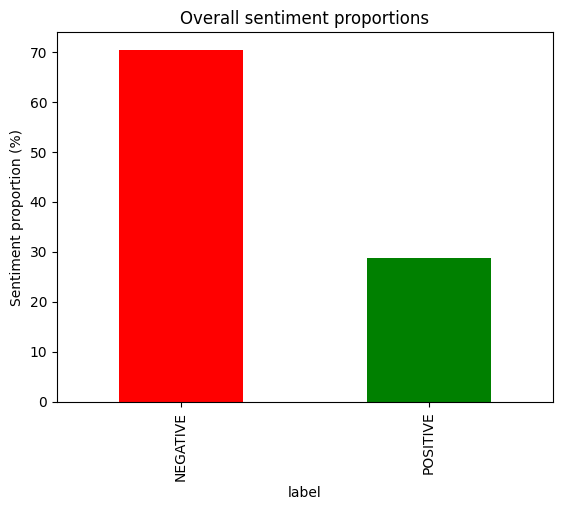

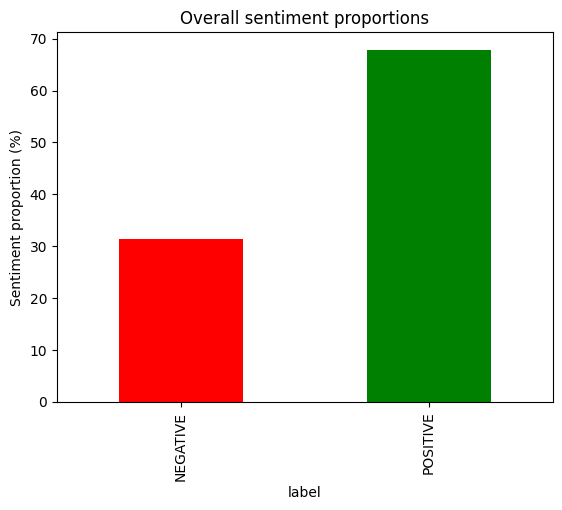

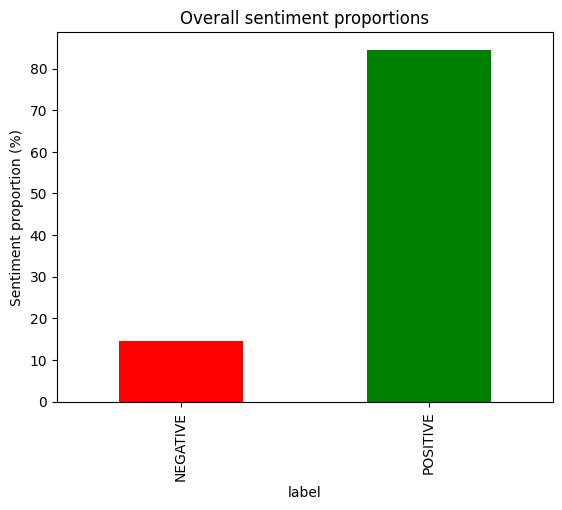

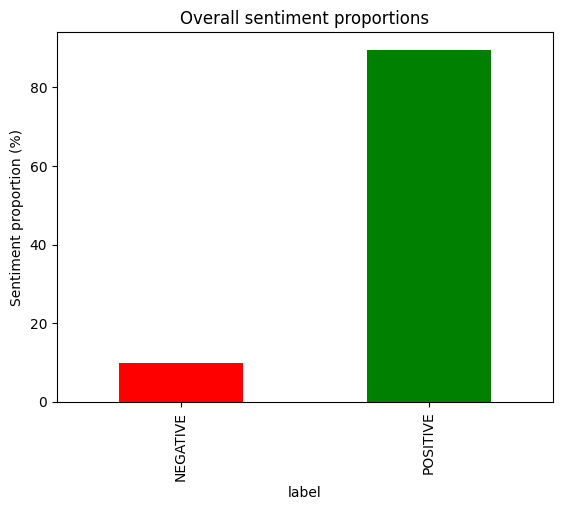

label
NEGATIVE     9.912867
POSITIVE    89.588325
Name: score, dtype: float64

In [90]:
bias = run(df_bert_bias)
edu = run(df_bert_education)
mic = run(df_bert_microsoft)
ux = run(df_bert_ux)

calculate_overall_sentiment(bias)
calculate_overall_sentiment(edu)
calculate_overall_sentiment(mic)
calculate_overall_sentiment(ux)